# Introduction

Here is the proofread version with corrections and suggestions for improved clarity:

### Problem Statement

The primary objective of this case study is to understand the factors that influence loan default in the Lending Club dataset. The aim is to identify key factors that indicate if a person is likely to default on their loan, which can help the company make informed decisions to minimize financial losses. Specifically, the company wants to distinguish between borrowers who are likely to repay the loan and those who are at risk of defaulting (labeled as 'charged-off').

#### Analysis Approach

1. **Data Cleaning and Preprocessing**:
    - Load and explore the dataset to understand its structure and content.
    - Clean the data by handling missing values, correcting data types, and dealing with high cardinality columns.
    - Exclude irrelevant columns such as `zip_code`, `emp_title`, and `title` to streamline the analysis.

2. **Outlier Detection and Handling**:
    - Select an appropriate `outlier removal method`.
    - Identify outliers in key numerical columns and determine their impact on the analysis.
    - Apply appropriate techniques to handle outliers, such as transformation, capping, or removal.

3. **Feature Engineering**:
    - Create new features based on existing data to enhance the predictive power of the analysis.
    - Consider binning continuous variables, creating interaction terms, and other transformations.

4. **Univariate Analysis**:
    - Perform univariate analysis on numerical columns to understand their distributions and identify any outliers.
    - Perform univariate analysis on categorical columns to explore the frequency distributions of different categories.

5. **Bivariate Analysis**:
    - Analyze relationships between pairs of variables to identify patterns and correlations.
    - Use `correlation matrices` and `scatter/pair plots` to illustrate these relationships.

6. **Segmented Analysis**:
    - Perform analysis segmented by loan status.

7. **Insights and Recommendations**:
    - Summarize key insights from the univariate and bivariate analyses.
    - Provide actionable recommendations to the company based on the findings.
    - Outline future work.

This approach ensures a thorough examination of the dataset to uncover meaningful patterns and relationships that can help the company minimize credit losses by identifying risky loan applicants. The analysis will be documented in a well-commented Python notebook and summarized in a presentation with relevant visualizations.

# Import required libraries, set styles and some common functions

In [1]:
# %pip install tabulate, plotly-express
# %pip install --upgrade nbformat

In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import skew, kurtosis
from scipy.cluster.hierarchy import linkage, dendrogram
import plotly.express as px
from sklearn.ensemble import IsolationForest


# Set plot style
# Print available style and use as required
# print(plt.style.available)
plt.style.use('seaborn-v0_8-darkgrid')

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

In [3]:
import pandas as pd
from scipy.stats import skew, kurtosis


def detailed_descriptive_categorical(data: pd.DataFrame) -> pd.DataFrame:
    columns = data.select_dtypes(exclude=[
                                 'int8', 'int16', 'int32', 'int64', 'Int64', 'float16', 'float32', 'float64']).columns
    stats = pd.DataFrame(index=columns)
    stats['missing_values'] = data[columns].isna().sum()
    stats['unique_values'] = data[columns].nunique()
    stats['most_frequent'] = data[columns].mode().iloc[0]
    stats['frequency'] = data[columns].apply(
        lambda x: x.value_counts().iloc[0])
    stats['top_5_frequent'] = data[columns].apply(
        lambda x: x.value_counts().head(5).to_dict())
    return stats


def detailed_descriptive_numerical(data: pd.DataFrame) -> pd.DataFrame:
    columns = data.select_dtypes(include=[
                                 'int8', 'int16', 'int32', 'int64', 'Int64', 'float16', 'float32', 'float64']).columns
    # columns = sorted(columns)
    stats = data[columns].describe().round(2).T
    stats['missing_values'] = data[columns].isna().sum()
    stats['skew'] = data[columns].skew()
    stats['kurtosis'] = data[columns].kurtosis()
    stats['mode'] = data[columns].mode().iloc[0]
    return stats

# Load orginal CSV data.

In [4]:
# loan_data = pd.read_csv('data/loan.csv', na_values=['NA'])
loan_data = pd.read_csv(
    'https://raw.githubusercontent.com/mohiteamit/UpGrad-LendingClubStudy/master/data/loan.csv', na_values=['NA'])


# loan_data.to_pickle('data/data_original.pkl')


print("Loan Dataset:")

display(loan_data.head())

C:\Users\amit.mohite\AppData\Local\Temp\ipykernel_20928\783823672.py:2: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  loan_data = pd.read_csv(


Loan Dataset:


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

# Data cleaning

### Descriptive statistics and data frame shortening 


1. `Columns with 100% missing` - Large number of columns do not have any data (100% missing). We will be dropping all these columns.
2. `Columns with high level of missing` - We are also dropping any column with missing value > 10%. 10% is not standard criteria but it works in current context.
3. `Columns with constant value` - we are deleting all columns with only have one unique value.
4. `Columns where each value is unique` - we are deleting such columns. Example - member_id.
5. Post above deletions, we have created `unique_values.xlsx` which helps us review unique values in each remianing column and decide next steps like reformatiing data to correct data type.  

Details of missing % by column.

| Column Name                      | Value       |
|----------------------------------|-------------|
| emp_title                        | 6.191303    |
| emp_length                       | 2.706650    |
| desc                             | 32.585543   |
| title                            | 0.027696    |
| mths_since_last_delinq           | 64.662487   |
| mths_since_last_record           | 92.985372   |
| revol_util                       | 0.125891    |
| last_pymnt_d                     | 0.178765    |
| next_pymnt_d                     | 97.129693   |
| last_credit_pull_d               | 0.005036    |
| collections_12_mths_ex_med       | 0.140998    |
| mths_since_last_major_derog      | 100.000000  |
| annual_inc_joint                 | 100.000000  |
| dti_joint                        | 100.000000  |
| verification_status_joint        | 100.000000  |
| tot_coll_amt                     | 100.000000  |
| tot_cur_bal                      | 100.000000  |
| open_acc_6m                      | 100.000000  |
| open_il_6m                       | 100.000000  |
| open_il_12m                      | 100.000000  |
| open_il_24m                      | 100.000000  |
| mths_since_rcnt_il               | 100.000000  |
| total_bal_il                     | 100.000000  |
| il_util                          | 100.000000  |
| open_rv_12m                      | 100.000000  |
| open_rv_24m                      | 100.000000  |
| max_bal_bc                       | 100.000000  |
| all_util                         | 100.000000  |
| total_rev_hi_lim                 | 100.000000  |
| inq_fi                           | 100.000000  |
| total_cu_tl                      | 100.000000  |
| inq_last_12m                     | 100.000000  |
| acc_open_past_24mths             | 100.000000  |
| avg_cur_bal                      | 100.000000  |
| bc_open_to_buy                   | 100.000000  |
| bc_util                          | 100.000000  |
| chargeoff_within_12_mths         | 0.140998    |
| mo_sin_old_il_acct               | 100.000000  |
| mo_sin_old_rev_tl_op             | 100.000000  |
| mo_sin_rcnt_rev_tl_op            | 100.000000  |
| mo_sin_rcnt_tl                   | 100.000000  |
| mort_acc                         | 100.000000  |
| mths_since_recent_bc             | 100.000000  |
| mths_since_recent_bc_dlq         | 100.000000  |
| mths_since_recent_inq            | 100.000000  |
| mths_since_recent_revol_delinq   | 100.000000  |
| num_accts_ever_120_pd            | 100.000000  |
| num_actv_bc_tl                   | 100.000000  |
| num_actv_rev_tl                  | 100.000000  |
| num_bc_sats                      | 100.000000  |
| num_bc_tl                        | 100.000000  |
| num_il_tl                        | 100.000000  |
| num_op_rev_tl                    | 100.000000  |
| num_rev_accts                    | 100.000000  |
| num_rev_tl_bal_gt_0              | 100.000000  |
| num_sats                         | 100.000000  |
| num_tl_120dpd_2m                 | 100.000000  |
| num_tl_30dpd                     | 100.000000  |
| num_tl_90g_dpd_24m               | 100.000000  |
| num_tl_op_past_12m               | 100.000000  |
| pct_tl_nvr_dlq                   | 100.000000  |
| percent_bc_gt_75                 | 100.000000  |
| pub_rec_bankruptcies             | 1.754916    |
| tax_liens                        | 0.098195    |
| tot_hi_cred_lim                  | 100.000000  |
| total_bal_ex_mort                | 100.000000  |
| total_bc_limit                   | 100.000000  |
| total_il_high_credit_limit       | 100.000000  |


In [5]:
columns_with_missings = loan_data.isnull().mean() * 100
print(columns_with_missings[columns_with_missings > 0])

emp_title                           6.191303
emp_length                          2.706650
desc                               32.585543
title                               0.027696
mths_since_last_delinq             64.662487
mths_since_last_record             92.985372
revol_util                          0.125891
last_pymnt_d                        0.178765
next_pymnt_d                       97.129693
last_credit_pull_d                  0.005036
collections_12_mths_ex_med          0.140998
mths_since_last_major_derog       100.000000
annual_inc_joint                  100.000000
dti_joint                         100.000000
verification_status_joint         100.000000
tot_coll_amt                      100.000000
tot_cur_bal                       100.000000
open_acc_6m                       100.000000
open_il_6m                        100.000000
open_il_12m                       100.000000
open_il_24m                       100.000000
mths_since_rcnt_il                100.000000
total_bal_

In [6]:
# All columns in dataframe
all = loan_data.columns

# Empty columns
columns_with_missings = loan_data.isnull().mean() * 100
print(columns_with_missings[columns_with_missings > 0].round(2))
columns_with_missings = columns_with_missings[columns_with_missings > 10]

# Columns with only one unique value
single_value_columns = one_unique_value_columns = [
    column for column in loan_data.columns if loan_data[column].nunique() == 1]

# Columns like ID
columns_like_id = one_unique_value_columns = [
    column for column in loan_data.columns if loan_data[column].nunique() == len(loan_data)]

# Columns of interest
required_columns = [v for v in all if not (
    v in columns_with_missings or v in single_value_columns or v in columns_like_id)]

# Descriptive statistics for numeric columns
num_desc = loan_data[required_columns].describe()

# descriptive statistics for categorical columns
cat_desc = loan_data[required_columns].describe(include=['object', 'category'])

# Saving details to in an Excel for review
# with pd.ExcelWriter('descriptive_statistics.xlsx') as writer:
#     num_desc.to_excel(writer, sheet_name='Numeric')
#     cat_desc.to_excel(writer, sheet_name='Categorical')
#     pd.DataFrame(columns_with_missings, columns=['blank_columns']).to_excel(writer, sheet_name='columns_with_missings')
#     pd.DataFrame(single_value_columns, columns=['single_value_columns']).to_excel(writer, sheet_name='single_value_columns')
#     pd.DataFrame(columns_like_id, columns=['columns_like_id']).to_excel(writer, sheet_name='columns_like_id')
#     pd.DataFrame(all, columns=['all']).to_excel(writer, sheet_name='all')

loan_data = loan_data[required_columns]
# loan_data.to_pickle('data\loan_data_required_columns.pkl')
loan_data.shape

emp_title                           6.19
emp_length                          2.71
desc                               32.59
title                               0.03
mths_since_last_delinq             64.66
mths_since_last_record             92.99
revol_util                          0.13
last_pymnt_d                        0.18
next_pymnt_d                       97.13
last_credit_pull_d                  0.01
collections_12_mths_ex_med          0.14
mths_since_last_major_derog       100.00
annual_inc_joint                  100.00
dti_joint                         100.00
verification_status_joint         100.00
tot_coll_amt                      100.00
tot_cur_bal                       100.00
open_acc_6m                       100.00
open_il_6m                        100.00
open_il_12m                       100.00
open_il_24m                       100.00
mths_since_rcnt_il                100.00
total_bal_il                      100.00
il_util                           100.00
open_rv_12m     

(39717, 41)

### Unique values -  details of unique values in each column

In [7]:
unique_values = {}
# Iterate through each column and get the unique values
for column in loan_data.columns:
    unique_values[column] = sorted(loan_data[column].astype(str).unique())

# Write the unique values DataFrame to an Excel file
d = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in unique_values.items()]))
# d.to_excel('unique_values.xlsx', index=False)

### Post review of `unique_values.xlsx` and `Data_Dictionary.xlsx`, we have decided following columns are not important for EDA

- `emp_title`
- `title`
- `zip_code`

In [8]:
loan_data = loan_data.drop(columns=['emp_title', 'title', 'zip_code'])

### Post review of `Data_Dictionary.xlsx` we have concluded some data is available before loan is approved and some data is collected after loan is disbured


#### Pre-loan - Data know before approving loan

| Column Name       | Description                                                   |
|-------------------|---------------------------------------------------------------|
| addr_state        | The state provided by the borrower in the loan application.   |
| annual_inc        | The self-reported annual income provided by the borrower.     |
| delinq_2yrs       | The number of 30+ days past-due incidences of delinquency.    |
| dti               | A ratio calculated using the borrower’s total monthly debt.   |
| earliest_cr_line  | The month the borrower's earliest reported credit line.       |
| emp_length        | Employment length in years.                                   |
| funded_amnt       | The total amount committed to that loan at that point in time.|
| funded_amnt_inv   | The total amount funded by investors for that loan.           |
| grade             | LC assigned loan grade.                                       |
| home_ownership    | The home ownership status provided by the borrower.           |
| installment       | The monthly payment owed by the borrower.                     |
| int_rate          | Interest rate on the loan.                                    |
| issue_d           | The month which the loan was funded.                          |
| loan_amnt         | The listed amount of the loan applied for by the borrower.    |
| open_acc          | The number of open credit lines in the borrower's credit file.|
| pub_rec_bankruptcies | Number of public record bankruptcies.                       |
| purpose           | A category provided by the borrower for the loan request.     |
| revol_bal         | Total credit revolving balance.                               |
| revol_util        | Revolving line utilization rate.                              |
| sub_grade         | LC assigned loan subgrade.                                    |
| term              | The number of payments on the loan.                           |
| total_acc         | The total number of credit lines currently in the borrower’s credit file. |
| verification_status | Indicates if income was verified by LC.                      |
| inq_last_6mths    | The number of inquiries in the past 6 months.                 |



#### Post-loan - Data know after loan is disbursed

| Column Name              | Description                                                   |
|--------------------------|---------------------------------------------------------------|
| collection_recovery_fee  | Post charge off collection fee.                               |
| inq_last_6mths           | The number of inquiries in the past 6 months.                 |
| last_credit_pull_d       | The most recent month LC pulled credit for this loan.         |
| last_pymnt_amnt          | Last total payment amount received.                           |
| last_pymnt_d             | Last month payment was received.                              |
| loan_status              | Current status of the loan.                                   |
| out_prncp                | Remaining outstanding principal for total amount funded.      |
| out_prncp_inv            | Remaining outstanding principal for portion of total amount funded by investors. |
| pub_rec                  | Number of derogatory public records.                          |
| recoveries               | Post charge off gross recovery.                               |
| total_pymnt              | Payments received to date for total amount funded.            |
| total_pymnt_inv          | Payments received to date for portion of total amount funded by investors. |
| total_rec_int            | Interest received to date.                                    |
| total_rec_late_fee       | Late fees received to date.                                   |
| total_rec_prncp          | Principal received to date.                                   |


### Fix data type

In [9]:
loan_data.dtypes

loan_amnt                    int64
funded_amnt                  int64
funded_amnt_inv            float64
term                        object
int_rate                    object
installment                float64
grade                       object
sub_grade                   object
emp_length                  object
home_ownership              object
annual_inc                 float64
verification_status         object
issue_d                     object
loan_status                 object
purpose                     object
addr_state                  object
dti                        float64
delinq_2yrs                  int64
earliest_cr_line            object
inq_last_6mths               int64
open_acc                     int64
pub_rec                      int64
revol_bal                    int64
revol_util                  object
total_acc                    int64
out_prncp                  float64
out_prncp_inv              float64
total_pymnt                float64
total_pymnt_inv     

Comparing against `unique_values.xlsx` following changes are required to dataframe. 

**NOTE : we are forcing many columns to integer by rounding the data**. This is done simplify further steps and truncation should not cause impact on analysis. Also in many cases decimal data is insignifcant. For example `dti` of 0.01 or `last_pymnt_amnt` of 1.82



| Column Name                | Data Type Change                                    |
|----------------------------|-----------------------------------------------------|
| loan_amnt                  | Int64                                               |
| funded_amnt                | Int64                                               |
| funded_amnt_inv            | Int64                                               |
| term                       | categorical ordered                                 |
| int_rate                   | float64 - remove % sign                             |
| installment                | Int64                                               |
| grade                      | categorical ordered                                 |
| sub_grade                  | categorical ordered                                 |
| emp_length                 | categorical ordered                                 |
| home_ownership             | categorical ordered                                 |
| annual_inc                 | Int64                                               |
| verification_status        | categorical                                         |
| issue_d                    | date - current data is in format: dd-yy             |
| loan_status                | categorical ordered                                 |
| purpose                    | categorical                                         |
| addr_state                 | objectcategorical                                   |
| dti                        | Int64                                               |
| delinq_2yrs                | Int64                                               |
| earliest_cr_line           | date - current data is in format: dd-yy             |
| inq_last_6mths             | Int64                                               |
| open_acc                   | Int64                                               |
| pub_rec                    | Int64                                               |
| revol_bal                  | Int64                                               |
| revol_util                 | Int64 - remove % sign                               |
| total_acc                  | Int64                                               |
| out_prncp                  | Int64                                               |
| out_prncp_inv              | Int64                                               |
| total_pymnt                | Int64                                               |
| total_pymnt_inv            | Int64                                               |
| total_rec_prncp            | Int64                                               |
| total_rec_int              | Int64                                               |
| total_rec_late_fee         | Int64                                               |
| recoveries                 | Int64                                               |
| collection_recovery_fee    | Int64                                               |
| last_pymnt_d               | date - current data is in format: dd-yy             |
| last_pymnt_amnt            | Int64                                               |
| last_credit_pull_d         | date - current data is in format: dd-yy             |
| pub_rec_bankruptcies       | Categorical                                         |

In [10]:
loan_data['loan_amnt'] = loan_data['loan_amnt'].astype(
    float).round().astype('Int64')
loan_data['funded_amnt'] = loan_data['funded_amnt'].astype(
    float).round().astype('Int64')
loan_data['funded_amnt_inv'] = loan_data['funded_amnt_inv'].astype(
    float).round().astype('Int64')
# Both `36 months` and `60 months` had space and it had to be stripped
loan_data['term'] = pd.Categorical(loan_data['term'].str.strip(), categories=[
                                   '36 months', '60 months'], ordered=True)
loan_data['int_rate'] = loan_data['int_rate'].str.rstrip('%').astype(float)
loan_data['installment'] = loan_data['installment'].astype(
    float).round().astype('Int64')
loan_data['grade'] = pd.Categorical(loan_data['grade'], categories=[
                                    'A', 'B', 'C', 'D', 'E', 'F', 'G'], ordered=True)
loan_data['sub_grade'] = pd.Categorical(loan_data['sub_grade'], categories=['A1', 'A2', 'A3', 'A4', 'A5',
                                                                                        'B1', 'B2', 'B3', 'B4', 'B5',
                                                                                        'C1', 'C2', 'C3', 'C4', 'C5',
                                                                                        'D1', 'D2', 'D3', 'D4', 'D5',
                                                                                        'E1', 'E2', 'E3', 'E4', 'E5',
                                                                                        'F1', 'F2', 'F3', 'F4', 'F5',
                                                                                        'G1', 'G2', 'G3', 'G4', 'G5'], ordered=True)

loan_data['emp_length'] = pd.Categorical(loan_data['emp_length'], categories=['< 1 year', '1 year', '2 years', '3 years',
                                                                              '4 years', '5 years', '6 years',
                                                                              '7 years', '8 years', '9 years',
                                                                              '10+ years'], ordered=True)

loan_data['home_ownership'] = pd.Categorical(loan_data['home_ownership'], categories=[
                                             'NONE', 'OTHER', 'RENT', 'MORTGAGE', 'OWN'], ordered=True)

loan_data['annual_inc'] = loan_data['annual_inc'].astype(
    float).round().astype('Int64')
loan_data['verification_status'] = pd.Categorical(loan_data['verification_status'], categories=[
                                                  'Not Verified', 'Source Verified', 'Verified'], ordered=True)
loan_data['issue_d'] = pd.to_datetime(loan_data['issue_d'], format='%b-%y')
loan_data['loan_status'] = pd.Categorical(loan_data['loan_status'], categories=[
                                          'Charged Off', 'Current', 'Fully Paid'], ordered=True)
loan_data['purpose'] = loan_data['purpose'].astype('category')
loan_data['addr_state'] = loan_data['addr_state'].astype('category')
loan_data['dti'] = loan_data['dti'].astype(float).round().astype('Int64')
loan_data['delinq_2yrs'] = loan_data['delinq_2yrs'].astype('Int64')
loan_data['inq_last_6mths'] = loan_data['inq_last_6mths'].astype('Int64')
loan_data['open_acc'] = loan_data['open_acc'].astype('Int64')
loan_data['pub_rec'] = loan_data['pub_rec'].astype('Int64')
loan_data['revol_bal'] = loan_data['revol_bal'].astype('Int64')
loan_data['revol_util'] = loan_data['revol_util'].str.rstrip(
    '%').astype(float).round().astype('Int64')
loan_data['total_acc'] = loan_data['total_acc'].astype('Int64')
loan_data['out_prncp'] = loan_data['out_prncp'].astype(
    float).round().astype('Int64')
loan_data['out_prncp_inv'] = loan_data['out_prncp_inv'].astype(
    float).round().astype('Int64')
loan_data['total_pymnt'] = loan_data['total_pymnt'].astype(
    float).round().astype('Int64')
loan_data['total_pymnt_inv'] = loan_data['total_pymnt_inv'].astype(
    float).round().astype('Int64')
loan_data['total_rec_prncp'] = loan_data['total_rec_prncp'].astype(
    float).round().astype('Int64')
loan_data['total_rec_int'] = loan_data['total_rec_int'].astype(
    float).round().astype('Int64')
loan_data['total_rec_late_fee'] = loan_data['total_rec_late_fee'].astype(
    float).round().astype('Int64')
loan_data['recoveries'] = loan_data['recoveries'].astype(
    float).round().astype('Int64')
loan_data['collection_recovery_fee'] = loan_data['collection_recovery_fee'].astype(
    float).round().astype('Int64')
loan_data['last_pymnt_d'] = pd.to_datetime(
    loan_data['last_pymnt_d'], format='%b-%y')
loan_data['last_pymnt_amnt'] = loan_data['last_pymnt_amnt'].astype(
    float).round().astype('Int64')
loan_data['last_credit_pull_d'] = pd.to_datetime(
    loan_data['last_credit_pull_d'], format='%b-%y')
loan_data['pub_rec_bankruptcies'] = loan_data['pub_rec_bankruptcies'].astype(
    'Int64')

# We found special case for earliest_cr_line. Data starts at 1945 and goes up to 2008.


def adjust_year(date_str):
    date = pd.to_datetime(date_str, format='%b-%y')
    if date.year > 2008:
        date = date.replace(year=date.year - 100)
    return date


loan_data['earliest_cr_line'] = loan_data['earliest_cr_line'].apply(
    adjust_year)

### Removing rows with missing

In [11]:
display(detailed_descriptive_numerical(loan_data))

,count,mean,std,min,25%,50%,75%,max,missing_values,skew,kurtosis,mode
loan_amnt,39717.0,11219.44,7456.67,500.0,5500.0,10000.0,15000.0,35000.0,0,1.059317,0.768669,10000.0
funded_amnt,39717.0,10947.71,7187.24,500.0,5400.0,9600.0,15000.0,35000.0,0,1.08171,0.937552,10000.0
funded_amnt_inv,39717.0,10397.45,7128.45,0.0,5000.0,8975.0,14400.0,35000.0,0,1.106213,1.062546,5000.0
int_rate,39717.0,12.02,3.72,5.42,9.25,11.86,14.59,24.59,0,0.293729,-0.446665,10.99
installment,39717.0,324.57,208.87,16.0,167.0,280.0,431.0,1305.0,0,1.128404,1.246776,156.0
annual_inc,39717.0,68968.93,63793.77,4000.0,40404.0,59000.0,82300.0,6000000.0,0,30.949185,2302.737774,60000.0
dti,39717.0,13.32,6.69,0.0,8.0,13.0,19.0,30.0,0,-0.02733,-0.847494,14.0
delinq_2yrs,39717.0,0.15,0.49,0.0,0.0,0.0,0.0,11.0,0,5.022035,39.4125,0.0
inq_last_6mths,39717.0,0.87,1.07,0.0,0.0,1.0,1.0,8.0,0,1.390391,2.56216,0.0
open_acc,39717.0,9.29,4.4,2.0,6.0,9.0,12.0,44.0,0,1.003762,1.677572,7.0


In [12]:
display(detailed_descriptive_categorical(loan_data))

,missing_values,unique_values,most_frequent,frequency,top_5_frequent
term,0,2,36 months,29096,"{'36 months': 29096, '60 months': 10621}"
grade,0,7,B,12020,"{'B': 12020, 'A': 10085, 'C': 8098, 'D': 5307,..."
sub_grade,0,35,B3,2917,"{'B3': 2917, 'A4': 2886, 'A5': 2742, 'B5': 270..."
emp_length,1075,11,10+ years,8879,"{'10+ years': 8879, '< 1 year': 4583, '2 years..."
home_ownership,0,5,RENT,18899,"{'RENT': 18899, 'MORTGAGE': 17659, 'OWN': 3058..."
verification_status,0,3,Not Verified,16921,"{'Not Verified': 16921, 'Verified': 12809, 'So..."
issue_d,0,55,2011-12-01 00:00:00,2260,"{2011-12-01 00:00:00: 2260, 2011-11-01 00:00:0..."
loan_status,0,3,Fully Paid,32950,"{'Fully Paid': 32950, 'Charged Off': 5627, 'Cu..."
purpose,0,14,debt_consolidation,18641,"{'debt_consolidation': 18641, 'credit_card': 5..."
addr_state,0,50,CA,7099,"{'CA': 7099, 'NY': 3812, 'FL': 2866, 'TX': 272..."


Number of records deletions due to missing is low and we can safely delete these records.

In [13]:
before = loan_data.shape
loan_data = loan_data[loan_data['revol_util'].notna()]
loan_data = loan_data[loan_data['pub_rec_bankruptcies'].notna()]
loan_data = loan_data[loan_data['emp_length'].notna()]
loan_data = loan_data[loan_data['last_pymnt_d'].notna()]
loan_data = loan_data[loan_data['last_credit_pull_d'].notna()]
after = loan_data.shape

print(before)
print(after)
print(
    f'Deleted {before[0]-after[0]} rows which is {round(((before[0]-after[0])/before[0])*100, 2)}% of total rows')

(39717, 38)
(37835, 38)
Deleted 1882 rows which is 4.74% of total rows


### Outlier detection and handling

#### We are experimenting following methods and will use box plot to observe impact of each method

1. `Z Score`
2. `IQR`
3. `Isolation Forest`

In [14]:
# Quick review of numerical data
display(detailed_descriptive_numerical(loan_data))

,count,mean,std,min,25%,50%,75%,max,missing_values,skew,kurtosis,mode
loan_amnt,37835.0,11328.32,7477.23,500.0,5600.0,10000.0,15000.0,35000.0,0,1.050861,0.743797,10000.0
funded_amnt,37835.0,11050.28,7204.85,500.0,5500.0,10000.0,15000.0,35000.0,0,1.074604,0.916877,10000.0
funded_amnt_inv,37835.0,10618.1,7113.09,0.0,5000.0,9200.0,14602.5,35000.0,0,1.097227,1.034766,5000.0
int_rate,37835.0,12.07,3.73,5.42,9.32,11.86,14.61,24.59,0,0.279609,-0.457176,10.99
installment,37835.0,327.14,209.08,16.0,169.0,283.0,435.0,1305.0,0,1.125183,1.244513,156.0
annual_inc,37835.0,69670.97,63643.37,4000.0,41886.0,60000.0,83500.0,6000000.0,0,31.818822,2414.059078,60000.0
dti,37835.0,13.38,6.67,0.0,8.0,13.0,19.0,30.0,0,-0.030739,-0.841248,14.0
delinq_2yrs,37835.0,0.15,0.49,0.0,0.0,0.0,0.0,11.0,0,5.073685,40.565165,0.0
inq_last_6mths,37835.0,0.87,1.07,0.0,0.0,1.0,1.0,8.0,0,1.380765,2.503985,0.0
open_acc,37835.0,9.33,4.38,2.0,6.0,9.0,12.0,44.0,0,0.981537,1.530166,7.0


In [15]:
import numpy as np
import pandas as pd
from scipy.stats import zscore
from sklearn.ensemble import IsolationForest
import seaborn as sns
import matplotlib.pyplot as plt


def analyze_and_plot_outliers(df, column):
    """
    analyze_and_plot_outliers
    -------------------------

    Calculates Z score, IQR and IsolationForest score for each column and plots it using box plot overlayed with KDE and Strip plot.
    Takes special care to ensure X and Y scale align to allow visual comparision

    """

    print(f'---- {column} ----')

    # Copy dataframe as we are not yet trying to remove data
    df = pd.DataFrame(df[column], columns=[column])

    if df[column].std() == 0:
        df['z_score'] = 0
    else:
        df['z_score'] = np.abs(zscore(df[column]))
    df['outlier_z'] = df['z_score'] > 3

    # IQR Method
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    df['outlier_iqr'] = (df[column] < (Q1 - 1.5 * IQR)
                         ) | (df[column] > (Q3 + 1.5 * IQR))

    # Isolation Forest Method
    clf = IsolationForest(contamination=0.01, random_state=42)
    df['outlier_if'] = clf.fit_predict(df[[column]])
    df['outlier_if'] = df['outlier_if'] == -1

    plt.figure(figsize=(18, 6))

    outlier_methods = ['outlier_z', 'outlier_if', 'outlier_iqr']
    titles = ['Z-score Method', 'IsolationForest Method', 'IQR Method']

    for i, method in enumerate(outlier_methods):
        to_remove = df[df[method]][column].count()
        min_val = df[df[method] == False][column].min()
        med_val = df[df[method] == False][column].median()
        max_val = df[df[method] == False][column].max()

        plt.subplot(1, 3, i+1)
        sns.boxplot(data=df[df[method] == False], x=column, color='skyblue')
        # sns.swarmplot(data=df[df[method] == False], x=column, color='black', size=1)
        sns.stripplot(data=df[df[method] == False],
                      x=column, color='black', size=0.5, jitter=True)
        sns.kdeplot(data=df[df[method] == False],
                    x=column, color='orange', linewidth=2)
        plt.title(f'{column} ({titles[i]})')
        plt.xlabel(
            f'{column}\n(to_remove: {to_remove})\n(min: {min_val})\n(median: {med_val})\n(max: {max_val})')
        plt.ylabel('Density')
        plt.xscale('log')

    plt.tight_layout()
    plt.show()

---- loan_amnt ----


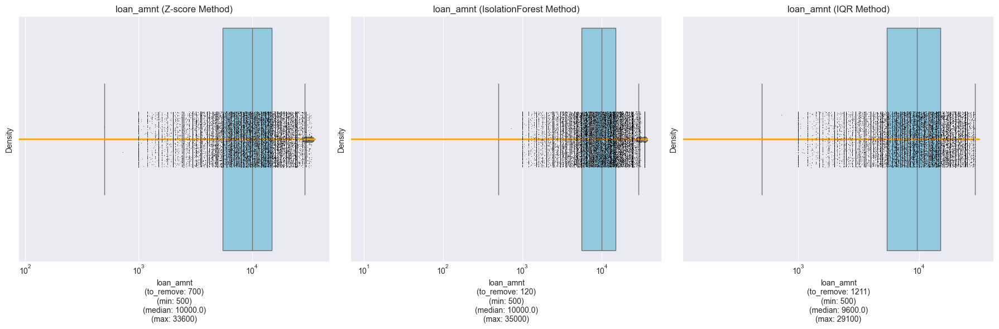

---- funded_amnt ----


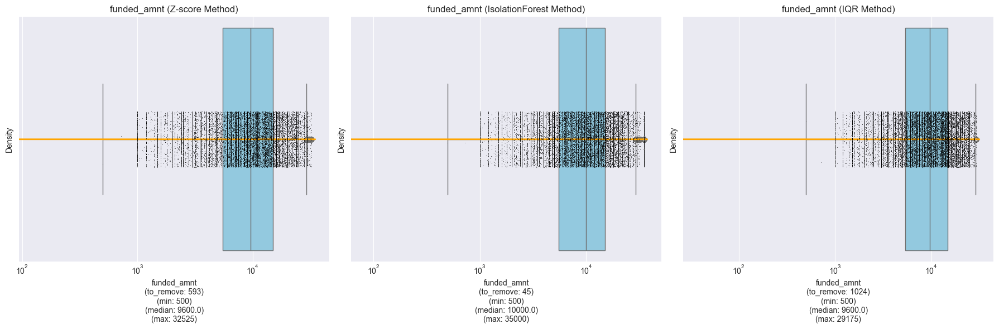

---- funded_amnt_inv ----


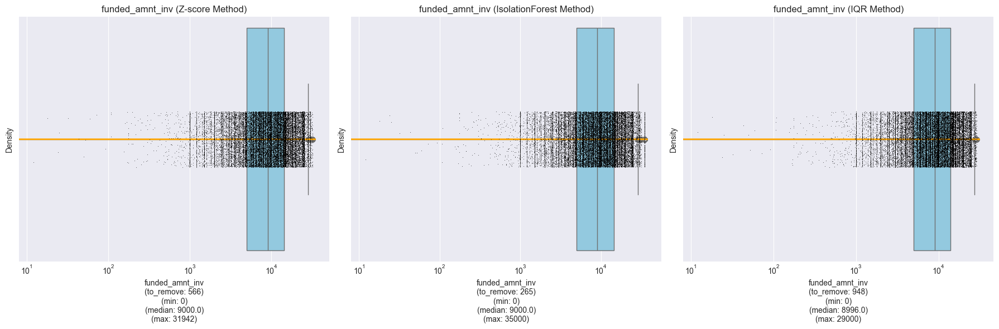

---- int_rate ----


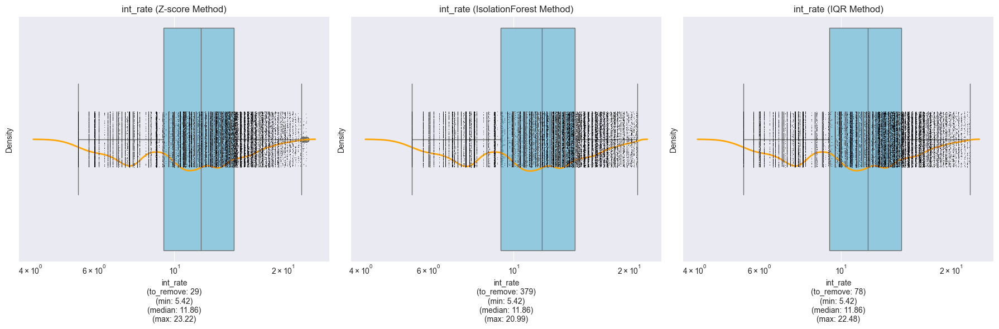

---- installment ----


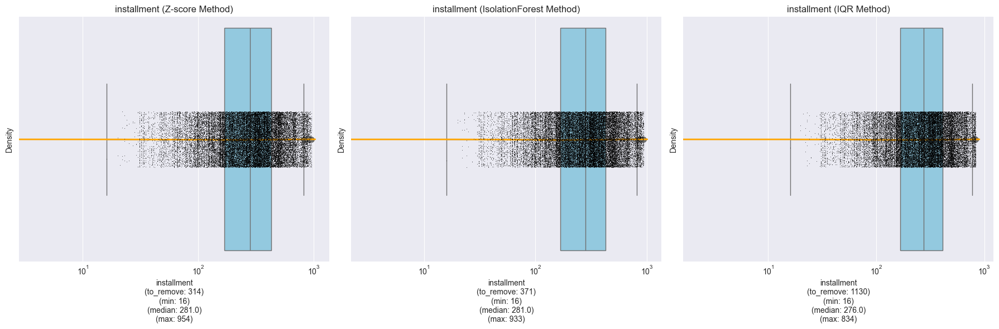

---- annual_inc ----


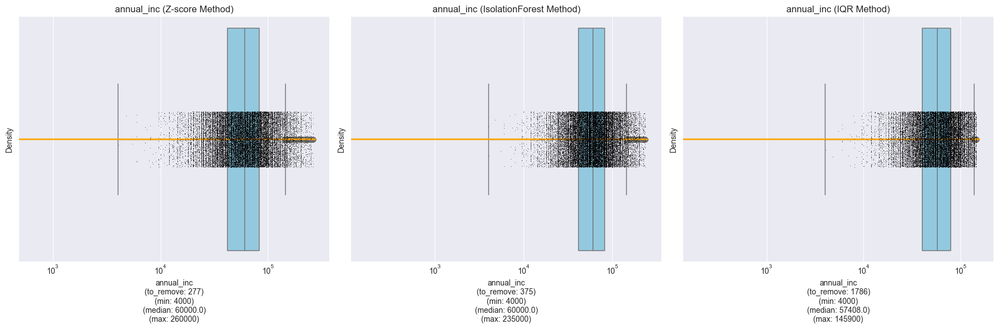

---- dti ----


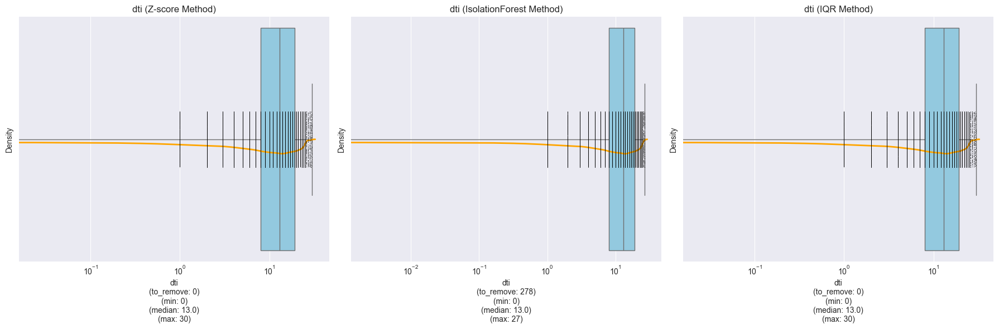

---- revol_bal ----


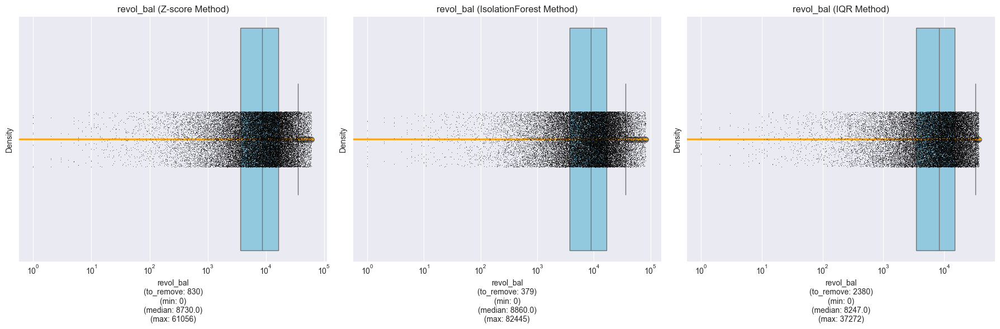

---- revol_util ----


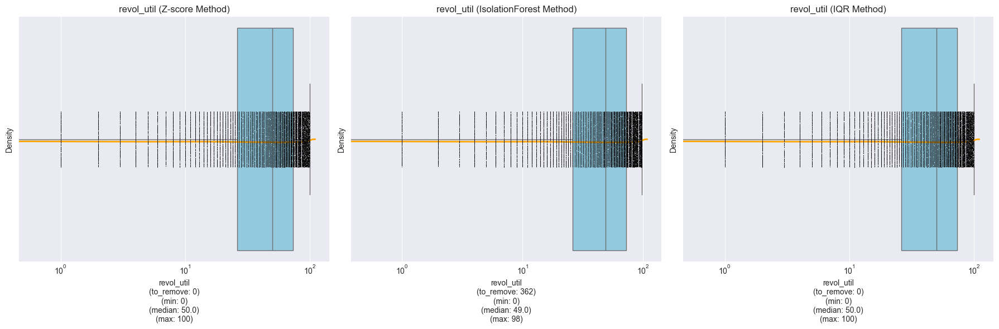

---- total_pymnt ----


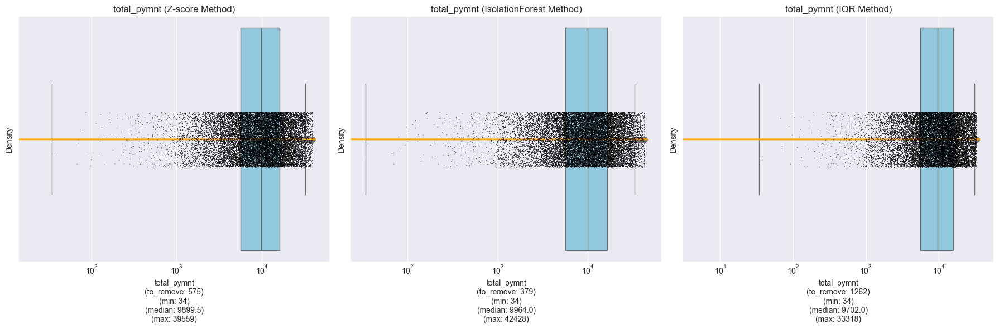

---- inq_last_6mths ----


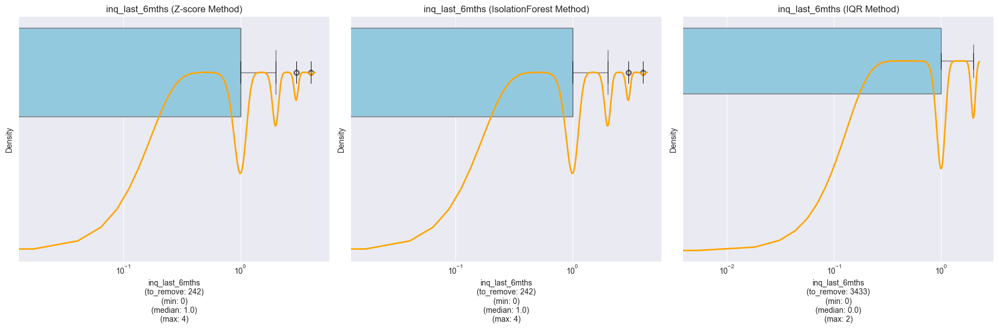

In [16]:
# for v in loan_data.select_dtypes(include=['int8', 'int16', 'int32', 'int64', 'Int64', 'float16', 'float32', 'float64']).columns:
#     analyze_and_plot_outliers(loan_data, v)

# We are limiting our search to few key variables.

analyze_and_plot_outliers(loan_data, 'loan_amnt')
analyze_and_plot_outliers(loan_data, 'funded_amnt')
analyze_and_plot_outliers(loan_data, 'funded_amnt_inv')
analyze_and_plot_outliers(loan_data, 'int_rate')
analyze_and_plot_outliers(loan_data, 'installment')
analyze_and_plot_outliers(loan_data, 'annual_inc')
analyze_and_plot_outliers(loan_data, 'dti')
analyze_and_plot_outliers(loan_data, 'revol_bal')
analyze_and_plot_outliers(loan_data, 'revol_util')
analyze_and_plot_outliers(loan_data, 'total_pymnt')
analyze_and_plot_outliers(loan_data, 'inq_last_6mths')

##### Conclusion

Here is how each outlier method we tested is working for us.
1. `IQR` -- removing lot more data than other methods. Sensitive of IQR to middle 50% may not good for financial data where difference between high and low income is critical.
2. `Z score` and `Isolation Forest` seems to remove smiliar number records. Spread of data after outlier removal is also similar. So we will choose between these two.
3. `Isolation Forest` at least in theroy should work for complex distribution.
4. We need remove outlier in following variables :
    - `loan_amnt`
    - `funded_amnt`
    - `funded_amnt_inv `
    - `int_rate`
    - `installment`
    - `annual_inc`
    - `dti`
    - `revol_bal`
    - `revol_util`
    - `total_pymnt`
    
We are not removing any outlier from `inq_last_6mths`. Number is low and we want to see impact it has on loan_status withput any outlier removal.

We will use `Isolation Forest` for outlier capping in the next step.

#### Outlier capping

In [17]:
import numpy as np
import pandas as pd
from sklearn.ensemble import IsolationForest


def cap_outliers_isolation_forest(df: pd.DataFrame, columns: list):
    # We are explicitly defining parameter to avoid randomness.
    contamination = 0.01

    clf = IsolationForest(contamination=contamination, random_state=42)

    for column in columns:
        df['outlier_if'] = clf.fit_predict(df[[column]])

        non_outliers = df[df['outlier_if'] == 1][column]
        lower_bound = non_outliers.min()
        upper_bound = non_outliers.max()

        df[column] = np.where(df[column] < lower_bound,
                              lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound,
                              upper_bound, df[column])

        df = df.drop(columns=['outlier_if'])
        print(f'Capped outliers in {column}')

    return df

In [18]:
c = [
    'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 'installment',
    'annual_inc', 'dti', 'revol_bal', 'revol_util', 'total_pymnt'
]

loan_data = cap_outliers_isolation_forest(loan_data, c)

Capped outliers in loan_amnt
Capped outliers in funded_amnt
Capped outliers in funded_amnt_inv
Capped outliers in int_rate
Capped outliers in installment
Capped outliers in annual_inc
Capped outliers in dti
Capped outliers in revol_bal
Capped outliers in revol_util
Capped outliers in total_pymnt


In [19]:
detailed_descriptive_numerical(
    loan_data[['annual_inc', 'dti', 'delinq_2yrs', 'open_acc', 'total_acc', 'pub_rec_bankruptcies']])

,count,mean,std,min,25%,50%,75%,max,missing_values,skew,kurtosis,mode
annual_inc,37835.0,67947.13,38844.78,4000.0,41886.0,60000.0,83500.0,235000.0,0,1.703567,3.901776,60000
dti,37835.0,13.37,6.64,0.0,8.0,13.0,19.0,27.0,0,-0.052318,-0.885285,14
delinq_2yrs,37835.0,0.15,0.49,0.0,0.0,0.0,0.0,11.0,0,5.073685,40.565165,0
open_acc,37835.0,9.33,4.38,2.0,6.0,9.0,12.0,44.0,0,0.981537,1.530166,7
total_acc,37835.0,22.2,11.38,2.0,14.0,21.0,29.0,90.0,0,0.821205,0.675709,16
pub_rec_bankruptcies,37835.0,0.04,0.2,0.0,0.0,0.0,0.0,2.0,0,4.66709,20.233854,0


In [20]:
# loan_data.to_pickle('data\loan_data_with_fixed_dtype.pkl')

### New Features and Encoding 

#### Loan issue date to loan issue month and year

In [21]:
loan_data['issue_d_month'] = pd.to_datetime(
    loan_data['issue_d']).dt.month.astype('Int64')
loan_data['issue_d_year'] = pd.to_datetime(
    loan_data['issue_d']).dt.year.astype('Int64')
loan_data[['issue_d', 'issue_d_month', 'issue_d_year']].head()

,issue_d,issue_d_month,issue_d_year
0,2011-12-01,12,2011
1,2011-12-01,12,2011
2,2011-12-01,12,2011
3,2011-12-01,12,2011
4,2011-12-01,12,2011


#### Calculate credit history age

In [22]:
# We have few members with credit history dating back to year 46, assuming it is 1946.

loan_data['credit_history_age_years'] = (pd.to_datetime(
    loan_data['issue_d']) - pd.to_datetime(loan_data['earliest_cr_line'])).dt.days
loan_data['credit_history_age_years'] = loan_data['credit_history_age_years'] / 365
loan_data['credit_history_age_years'] = loan_data['credit_history_age_years'].round(
    0).astype('Int64')
loan_data[['issue_d', 'earliest_cr_line', 'credit_history_age_years']].head()

,issue_d,earliest_cr_line,credit_history_age_years
0,2011-12-01,1985-01-01,27
1,2011-12-01,1999-04-01,13
2,2011-12-01,2001-11-01,10
3,2011-12-01,1996-02-01,16
4,2011-12-01,1996-01-01,16


Create categorical variable for bankruptcy

In [23]:
loan_data['bankruptcy_category'] = loan_data['pub_rec_bankruptcies'].map(
    {0: 'Not reported', 1: 'Reported', 2: 'Reported'})
loan_data['bankruptcy_category'] = loan_data['bankruptcy_category'].astype(
    'category')
loan_data['bankruptcy_category'] = loan_data['bankruptcy_category'].where(
    ~loan_data['pub_rec_bankruptcies'].isna(), other=pd.NA)

#### Create income bands.

Reference - https://www.statista.com/statistics/203183/percentage-distribution-of-household-income-in-the-us/

In [24]:
# Define the bins and labels based on the reference
bins = [-1, 15000, 25000, 35000, 50000, 75000,
        100000, 150000, 200000, float('inf')]
labels = [
    'Under 15,000',
    '15,000 to 24,999',
    '25,000 to 34,999',
    '35,000 to 49,999',
    '50,000 to 74,999',
    '75,000 to 99,999',
    '100,000 to 149,999',
    '150,000 to 199,999',
    '200,000 and over'
]

# Create the income_band column
loan_data['income_band'] = pd.cut(
    loan_data['annual_inc'], bins=bins, labels=labels)

# Display the new column to verify
loan_data[['annual_inc', 'income_band']].head()

,annual_inc,income_band
0,24000,"15,000 to 24,999"
1,30000,"25,000 to 34,999"
2,12252,"Under 15,000"
3,49200,"35,000 to 49,999"
4,80000,"75,000 to 99,999"


#### Monthly Installment to Income Ratio


In [25]:
loan_data['installment_to_income_ratio'] = loan_data['installment'] / \
    (loan_data['annual_inc'] / 12) * 100
loan_data['installment_to_income_ratio'] = loan_data['installment_to_income_ratio'].round(
    0).astype('Int64')
loan_data[['installment_to_income_ratio', 'installment', 'annual_inc']].head()

,installment_to_income_ratio,installment,annual_inc
0,8,163,24000
1,2,60,30000
2,8,84,12252
3,8,339,49200
4,1,68,80000


#### Interest rate level

In [26]:
loan_data['interest_rate_level'] = pd.cut(loan_data['int_rate'], bins=[
                                          0, 10, 15, 20, float('inf')], labels=['Low', 'Medium', 'High', 'Very High'])
loan_data[['interest_rate_level', 'int_rate']].head()

,interest_rate_level,int_rate
0,Medium,10.65
1,High,15.27
2,High,15.96
3,Medium,13.49
4,Medium,12.69


#### Investor funding ratio

In [27]:
loan_data['investor_funding_ratio'] = loan_data['funded_amnt_inv'] / \
    loan_data['funded_amnt'] * 100
loan_data[['funded_amnt_inv', 'funded_amnt', 'investor_funding_ratio']].head()

,funded_amnt_inv,funded_amnt,investor_funding_ratio
0,4975,5000,99.5
1,2500,2500,100.0
2,2400,2400,100.0
3,10000,10000,100.0
4,3000,3000,100.0


#### Balance loan remaining

In [28]:
# Remaining Balance
loan_data['remaining_balance'] = loan_data['funded_amnt'] - \
    loan_data['total_pymnt']
loan_data[['total_pymnt', 'funded_amnt', 'remaining_balance']].head()

,total_pymnt,funded_amnt,remaining_balance
0,5863,5000,-863
1,1009,2500,1491
2,3006,2400,-606
3,12232,10000,-2232
4,3513,3000,-513


#### Recovery amount and fee 

`recoveries` and `collection_recovery_fee` has zero for current and fully paid loans. This is confusing. Recovery does not apply to fully paid and current loans

Should we drop these columns?

In [29]:
loan_data['collection_recovery_fee'] = np.where(
    loan_data['loan_status'] != 'Charged Off',
    np.nan,
    loan_data['collection_recovery_fee']
)

loan_data['recoveries'] = np.where(
    loan_data['loan_status'] != 'Charged Off',
    np.nan,
    loan_data['recoveries']
)

print(loan_data[['loan_status', 'collection_recovery_fee', 'recoveries']].head())
print(loan_data[['loan_status', 'collection_recovery_fee',
      'recoveries']].isnull().mean() * 100)

   loan_status  collection_recovery_fee  recoveries
0   Fully Paid                      NaN         NaN
1  Charged Off                      1.0       117.0
2   Fully Paid                      NaN         NaN
3   Fully Paid                      NaN         NaN
4      Current                      NaN         NaN
loan_status                 0.000000
collection_recovery_fee    86.248183
recoveries                 86.248183
dtype: float64


#### Encode categorical variables for correlations

In [30]:
loan_data['verification_status'].unique()

['Verified', 'Source Verified', 'Not Verified']
Categories (3, object): ['Not Verified' < 'Source Verified' < 'Verified']

In [31]:
cat_map = {
    'loan_status': {'Charged Off': -5, 'Current': 0, 'Fully Paid': 5},
    'verification_status': {'Not Verified': 1, 'Source Verified': 2, 'Verified': 3},
    'grade': {'A': 1, 'B': 2, 'C': 3, 'D': 4, 'E': 5, 'F': 6, 'G': 7},
    'sub_grade': {'A1': 1, 'A2': 2, 'A3': 3, 'A4': 4, 'A5': 5, 'B1': 6, 'B2': 7, 'B3': 8, 'B4': 9, 'B5': 10,
                  'C1': 11, 'C2': 12, 'C3': 13, 'C4': 14, 'C5': 15, 'D1': 16, 'D2': 17, 'D3': 18, 'D4': 19, 'D5': 20,
                  'E1': 21, 'E2': 22, 'E3': 23, 'E4': 24, 'E5': 25, 'F1': 26, 'F2': 27, 'F3': 28, 'F4': 29, 'F5': 30,
                  'G1': 31, 'G2': 32, 'G3': 33, 'G4': 34, 'G5': 35},
    'emp_length': {'< 1 year': 1, '1 year': 2, '2 years': 3, '3 years': 4, '4 years': 5, '5 years': 6,
                   '6 years': 7, '7 years': 8, '8 years': 9, '9 years': 10, '10+ years': 11}
}

for col, mapping in cat_map.items():
    loan_data[col + '_encoded'] = loan_data[col].map(mapping).astype('Int64')

# Encode 'loan_risk_level' based on 'purpose'
loan_data['loan_risk_level'] = loan_data['purpose'].map({
    'debt_consolidation': 1,
    'credit_card': 1,
    'home_improvement': 2,
    'major_purchase': 2,
    'house': 2,
    'small_business': 3,
    'wedding': 4,
    'vacation': 4,
    'car': 5,
    'medical': 6,
    'moving': 7,
    'other': 8,
    'educational': 8,
    'renewable_energy': 8
}).astype('Int64')

loan_data[['purpose', 'loan_risk_level', 'loan_status', 'loan_status_encoded', 'grade', 'grade_encoded', 'sub_grade_encoded',
           'sub_grade', 'emp_length', 'emp_length_encoded', 'verification_status', 'verification_status_encoded']].head()

,purpose,loan_risk_level,loan_status,loan_status_encoded,grade,grade_encoded,sub_grade_encoded,sub_grade,emp_length,emp_length_encoded,verification_status,verification_status_encoded
0,credit_card,1,Fully Paid,5,B,2,7,B2,10+ years,11,Verified,3
1,car,5,Charged Off,-5,C,3,14,C4,< 1 year,1,Source Verified,2
2,small_business,3,Fully Paid,5,C,3,15,C5,10+ years,11,Not Verified,1
3,other,8,Fully Paid,5,C,3,11,C1,10+ years,11,Source Verified,2
4,other,8,Current,0,B,2,10,B5,1 year,2,Source Verified,2


In [32]:
# Helps validate we did not make mistake in encoding and merging
detailed_descriptive_numerical(loan_data)

,count,mean,std,min,25%,50%,75%,max,missing_values,skew,kurtosis,mode
loan_amnt,37835.0,11328.32,7477.23,500.0,5600.0,10000.0,15000.0,35000.0,0,1.050861,0.743797,10000.0
funded_amnt,37835.0,11050.28,7204.85,500.0,5500.0,10000.0,15000.0,35000.0,0,1.074604,0.916877,10000.0
funded_amnt_inv,37835.0,10618.1,7113.09,0.0,5000.0,9200.0,14602.5,35000.0,0,1.097227,1.034766,5000.0
int_rate,37835.0,12.06,3.71,5.42,9.32,11.86,14.61,20.99,0,0.235962,-0.584496,10.99
installment,37835.0,325.77,204.34,16.0,169.0,283.0,435.0,933.0,0,0.976204,0.485174,933.0
annual_inc,37835.0,67947.13,38844.78,4000.0,41886.0,60000.0,83500.0,235000.0,0,1.703567,3.901776,60000.0
dti,37835.0,13.37,6.64,0.0,8.0,13.0,19.0,27.0,0,-0.052318,-0.885285,14.0
delinq_2yrs,37835.0,0.15,0.49,0.0,0.0,0.0,0.0,11.0,0,5.073685,40.565165,0.0
inq_last_6mths,37835.0,0.87,1.07,0.0,0.0,1.0,1.0,8.0,0,1.380765,2.503985,0.0
open_acc,37835.0,9.33,4.38,2.0,6.0,9.0,12.0,44.0,0,0.981537,1.530166,7.0


#### Credit Score

**-------Experimental-------** 

We will know if this works looking at correlation with int_rate and loan_status.

We will calculate credit score by normalizing data and applying weights as follow.

weights = {
    'annual_inc': 0.2,
    'dti': 0.25,
    'credit_history_age_years': 0.2,
    'delinq_2yrs': 0.15,
    'open_acc': 0.05,
    'total_acc': 0.05,
    'pub_rec_bankruptcies': 0.05,
    'inq_last_6mths': 0.05
}

In [33]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Define weights for the composite score calculation, including the new variable
weights = {
    'annual_inc': 0.2,
    'dti': 0.25,
    'credit_history_age_years': 0.2,
    'delinq_2yrs': 0.15,
    'open_acc': 0.05,
    'total_acc': 0.05,
    'pub_rec_bankruptcies': 0.05,
    'inq_last_6mths': 0.05
}

columns = ['annual_inc', 'dti', 'credit_history_age_years', 'delinq_2yrs',
           'open_acc', 'total_acc', 'pub_rec_bankruptcies', 'inq_last_6mths']
score_data = loan_data[columns]

# Normalize the variables using Min-Max Scaling
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(score_data)
normalized_df = pd.DataFrame(
    normalized_data, columns=columns, index=loan_data.index)

# Apply weights and calculate the composite score
for col in columns:
    normalized_df[col] *= weights[col]

# Sum the weighted values to get the composite score
loan_data['composite_credit_score'] = normalized_df.sum(axis=1)

# Display the result
display(loan_data[['composite_credit_score', 'loan_status', 'annual_inc', 'dti', 'credit_history_age_years',
        'delinq_2yrs', 'open_acc', 'total_acc', 'pub_rec_bankruptcies', 'inq_last_6mths']].head())

,composite_credit_score,loan_status,annual_inc,dti,credit_history_age_years,delinq_2yrs,open_acc,total_acc,pub_rec_bankruptcies,inq_last_6mths
0,0.356153,Fully Paid,24000,27,27,0,3,9,0,1
1,0.097605,Charged Off,30000,1,13,0,3,4,0,5
2,0.130104,Fully Paid,12252,9,10,0,2,10,0,2
3,0.301915,Fully Paid,49200,20,16,0,10,37,0,1
4,0.310334,Current,80000,18,16,0,15,38,0,0


In [34]:
# loan_data.to_pickle('data\loan_data_with_features.pkl')

# Reload data - This is starting point for data exploration

In [35]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram
import plotly.express as px

plt.style.use('seaborn-v0_8-darkgrid')

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

# loan_data = pd.read_pickle('data\loan_data_with_features.pkl')

In [36]:
pre_loan_columns = [
    'addr_state',
    'annual_inc',
    'delinq_2yrs',
    'dti',
    'earliest_cr_line',
    'emp_length',
    'funded_amnt',
    'funded_amnt_inv',
    'grade',
    'home_ownership',
    'installment',
    'int_rate',
    'issue_d',
    'loan_amnt',
    'open_acc',
    'pub_rec_bankruptcies',
    'purpose',
    'loan_risk_level',              # new featue -- TODO - need reference
    'revol_bal',
    'revol_util',
    'sub_grade',
    'term',
    'total_acc',
    'verification_status',
    'verification_status_encoded',
    'issue_d_month',                # new featue
    'issue_d_year',                 # new featue
    'credit_history_age_years',     # new featue
    'bankruptcy_category',          # new featue
    'income_band',                  # new featue
    'installment_to_income_ratio',  # new featue
    'interest_rate_level',          # new featue
    'investor_funding_ratio',       # new featue
    'grade_encoded',
    'sub_grade_encoded',
    'emp_length_encoded',
    'loan_status_encoded',
    'loan_status',
    'inq_last_6mths',
    'composite_credit_score',

]
post_loan_columns = [
    'collection_recovery_fee',
    'last_credit_pull_d',
    'last_pymnt_amnt',
    'last_pymnt_d',
    'loan_status',
    'out_prncp',
    'out_prncp_inv',
    'pub_rec',
    'recoveries',
    'total_pymnt',
    'total_pymnt_inv',
    'total_rec_int',
    'total_rec_late_fee',
    'total_rec_prncp',
    'remaining_balance'                # new featue
]

# PRE-LOAN

We are focusing on pre-loan variables from this point in effort to find indicators which can help avoid `charged off` loans in future

In [37]:
ncols = [v for v in
         loan_data.select_dtypes(include=[
                                 'int8', 'int16', 'int32', 'int64', 'Int64', 'float16', 'float32', 'float64']).columns
         if v in pre_loan_columns
         ]


categorical_cols = [v for v in
                    loan_data.select_dtypes(
                        include=['object', 'category']).columns
                    if v in pre_loan_columns
                    ]


len(ncols), len(categorical_cols)

(26, 12)

# Univariate analysis

###  Numerical data

##### Detailed descriptive stats

In [38]:
display(detailed_descriptive_numerical(loan_data[ncols]))

,count,mean,std,min,25%,50%,75%,max,missing_values,skew,kurtosis,mode
loan_amnt,37835.0,11328.32,7477.23,500.0,5600.0,10000.0,15000.0,35000.0,0,1.050861,0.743797,10000.0
funded_amnt,37835.0,11050.28,7204.85,500.0,5500.0,10000.0,15000.0,35000.0,0,1.074604,0.916877,10000.0
funded_amnt_inv,37835.0,10618.1,7113.09,0.0,5000.0,9200.0,14602.5,35000.0,0,1.097227,1.034766,5000.0
int_rate,37835.0,12.06,3.71,5.42,9.32,11.86,14.61,20.99,0,0.235962,-0.584496,10.99
installment,37835.0,325.77,204.34,16.0,169.0,283.0,435.0,933.0,0,0.976204,0.485174,933.0
annual_inc,37835.0,67947.13,38844.78,4000.0,41886.0,60000.0,83500.0,235000.0,0,1.703567,3.901776,60000.0
dti,37835.0,13.37,6.64,0.0,8.0,13.0,19.0,27.0,0,-0.052318,-0.885285,14.0
delinq_2yrs,37835.0,0.15,0.49,0.0,0.0,0.0,0.0,11.0,0,5.073685,40.565165,0.0
inq_last_6mths,37835.0,0.87,1.07,0.0,0.0,1.0,1.0,8.0,0,1.380765,2.503985,0.0
open_acc,37835.0,9.33,4.38,2.0,6.0,9.0,12.0,44.0,0,0.981537,1.530166,7.0


##### Plots for Univariate analysis of Numerical variables

----- loan_amnt -----


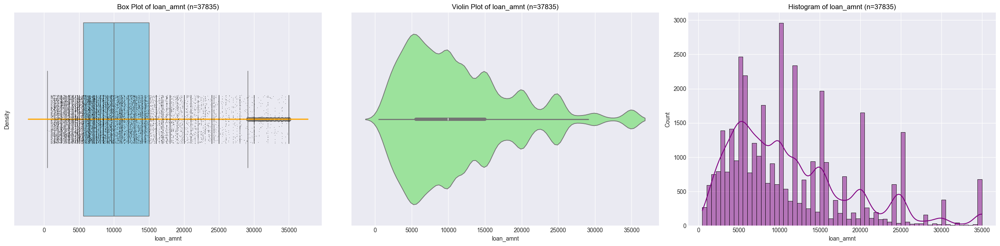

----- funded_amnt -----


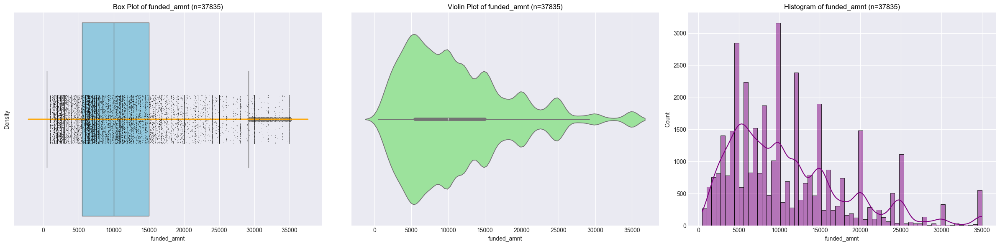

----- funded_amnt_inv -----


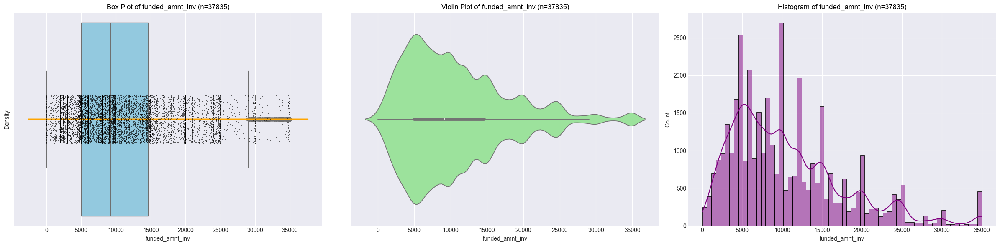

----- int_rate -----


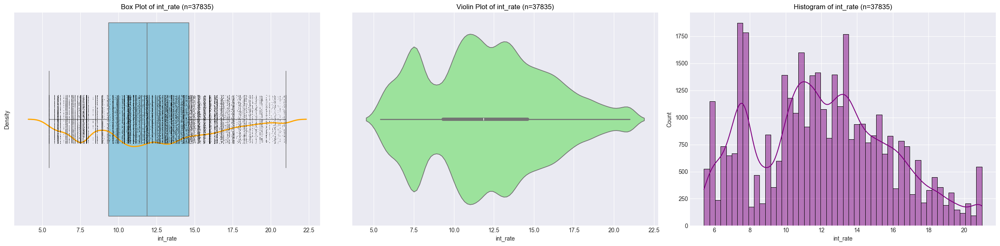

----- installment -----


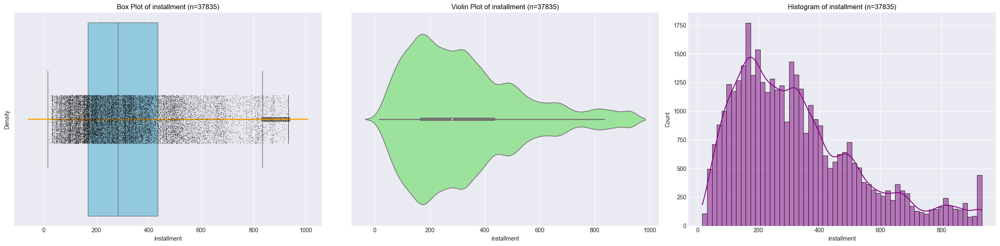

----- annual_inc -----


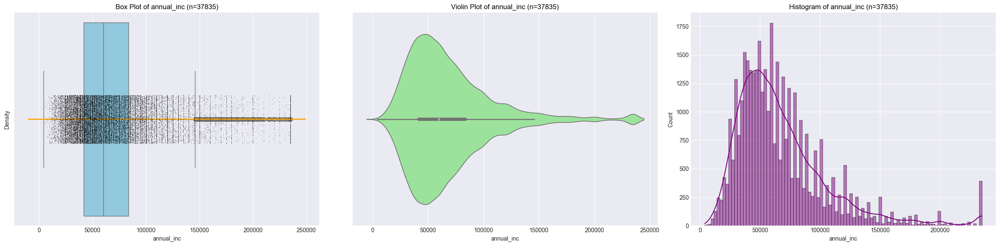

----- dti -----


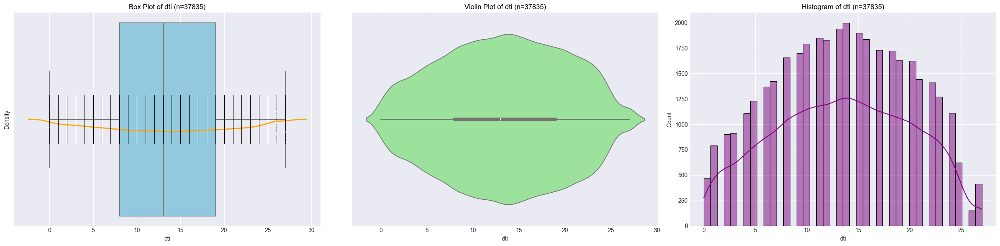

----- delinq_2yrs -----


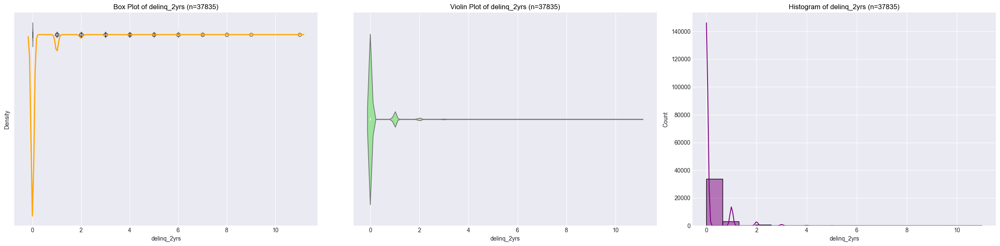

----- inq_last_6mths -----


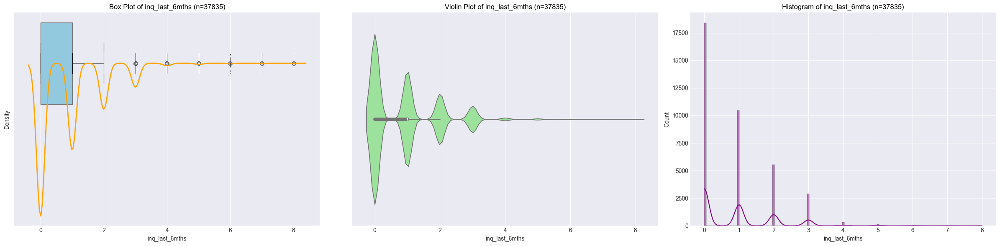

----- open_acc -----


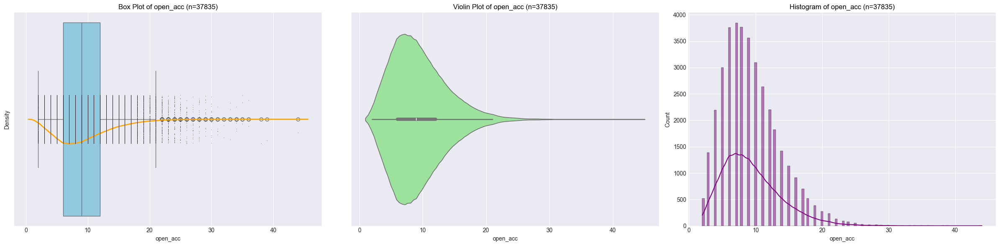

----- revol_bal -----


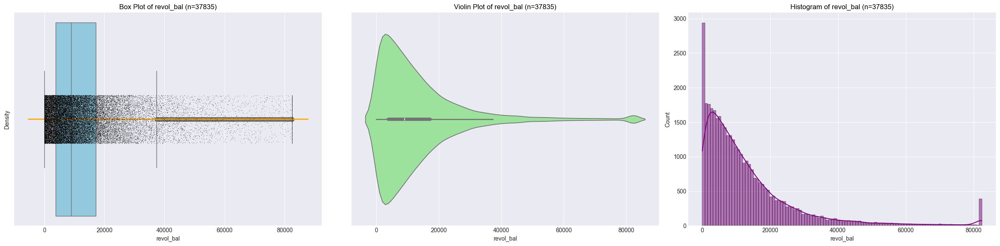

----- revol_util -----


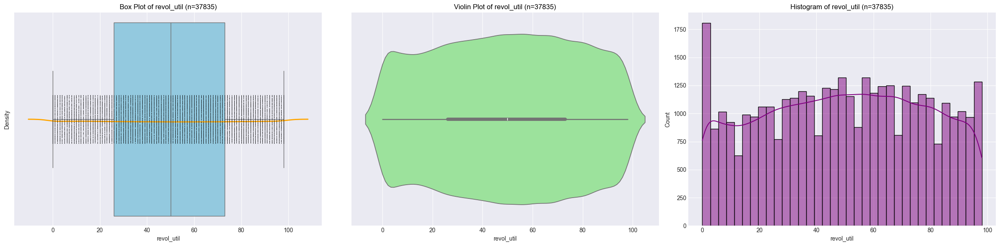

----- total_acc -----


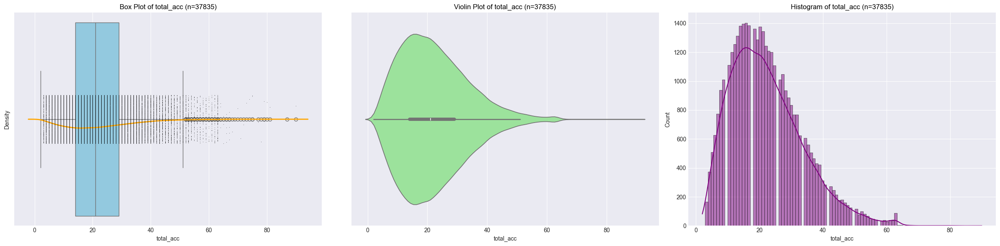

----- pub_rec_bankruptcies -----


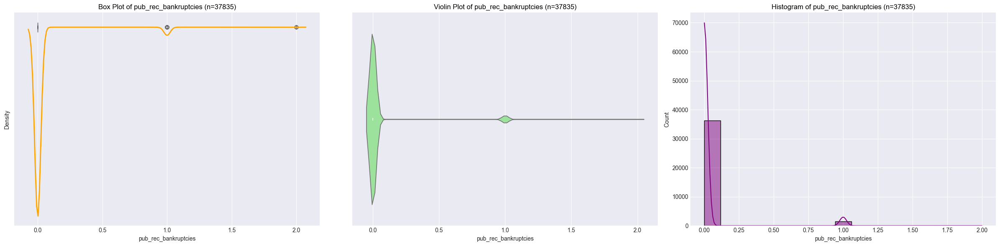

----- issue_d_month -----


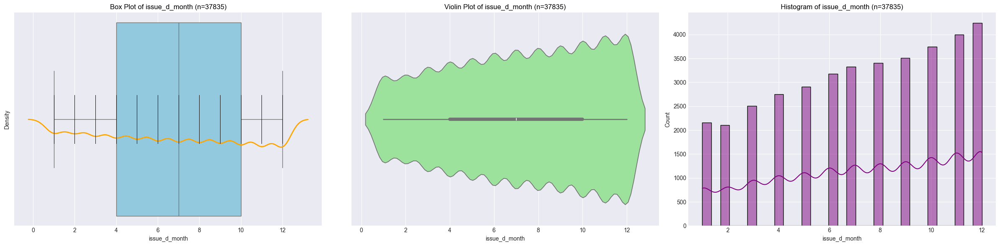

----- issue_d_year -----


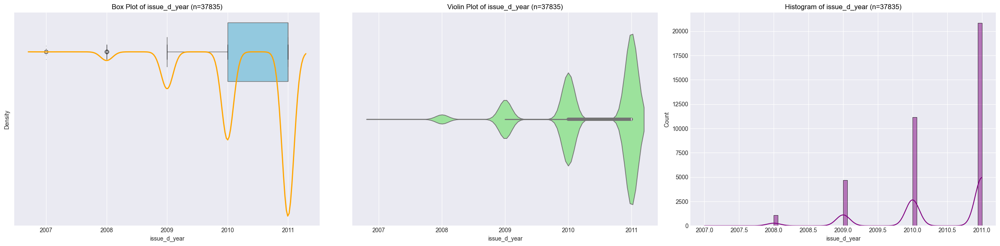

----- credit_history_age_years -----


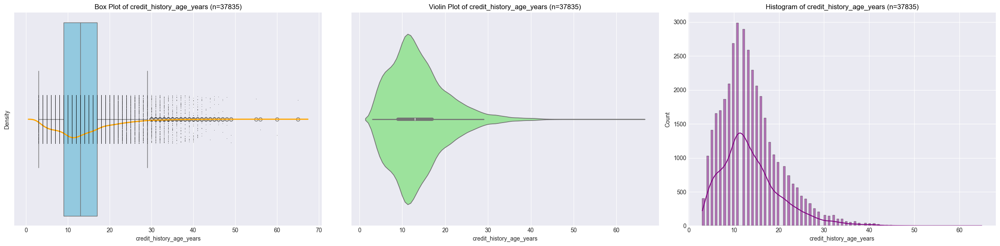

----- installment_to_income_ratio -----


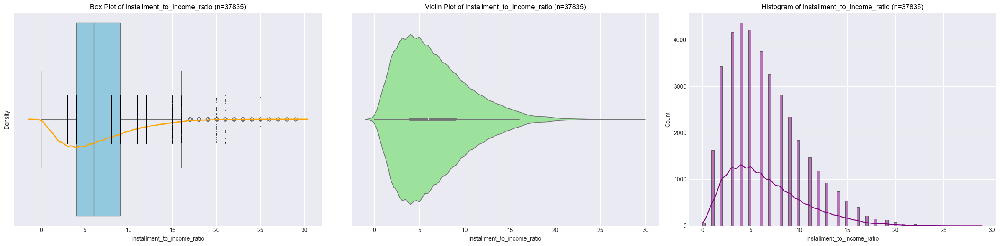

----- investor_funding_ratio -----


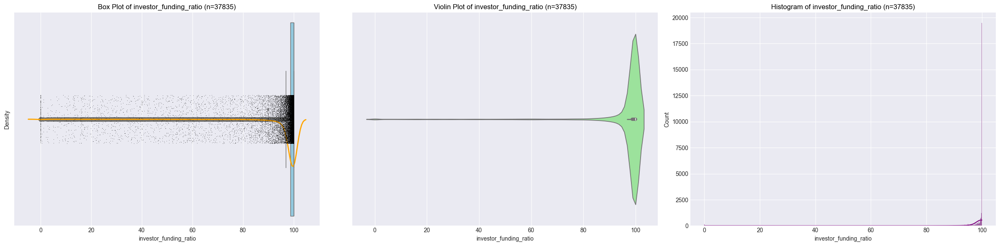

----- loan_status_encoded -----


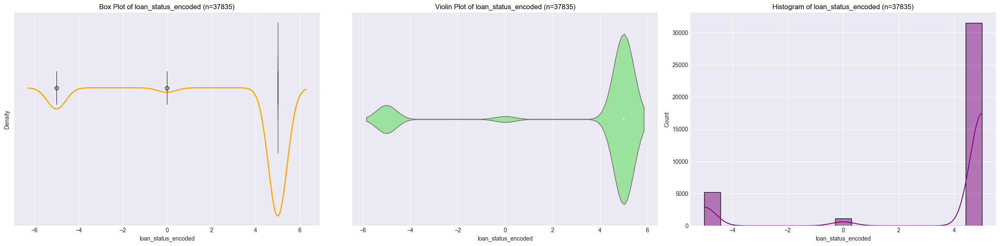

----- verification_status_encoded -----


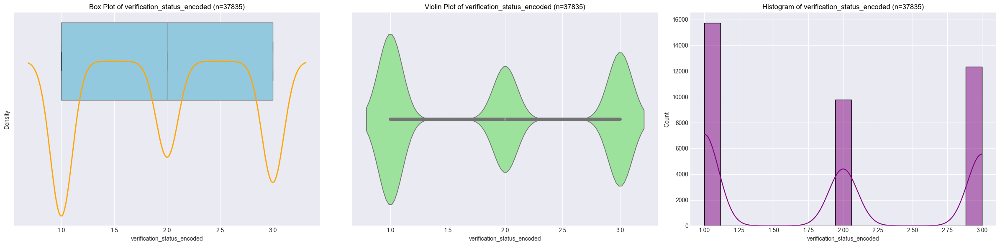

----- grade_encoded -----


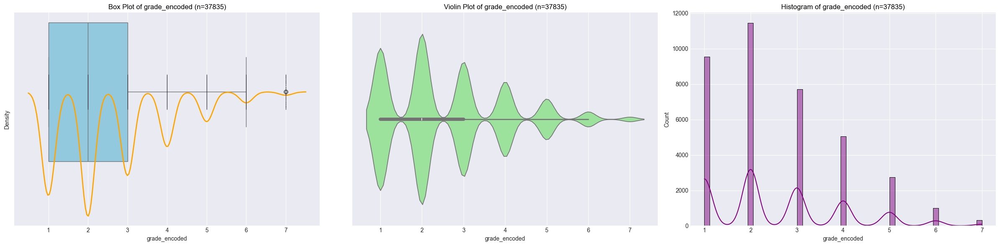

----- sub_grade_encoded -----


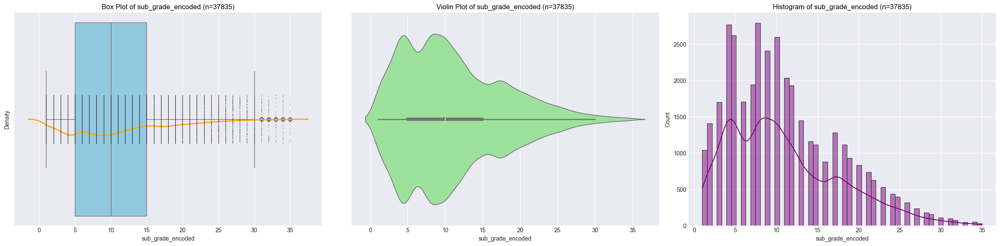

----- emp_length_encoded -----


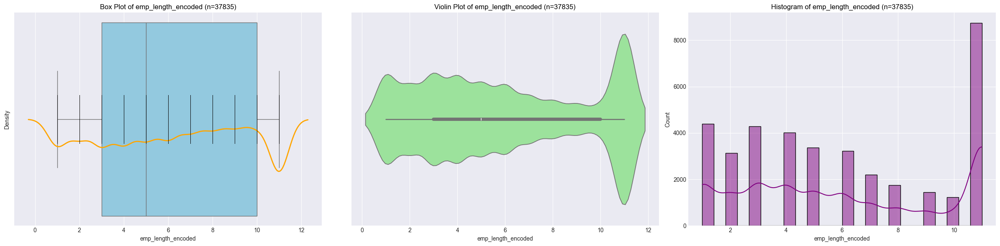

----- loan_risk_level -----


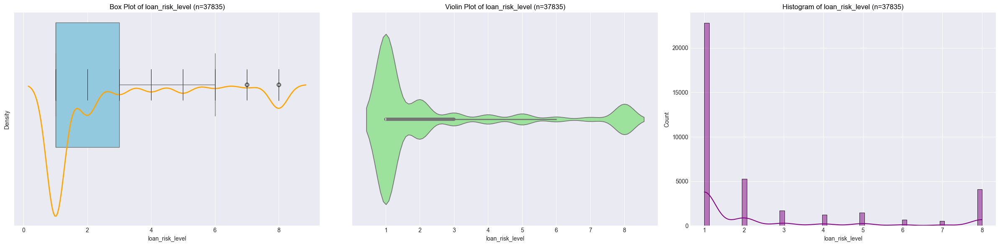

----- composite_credit_score -----


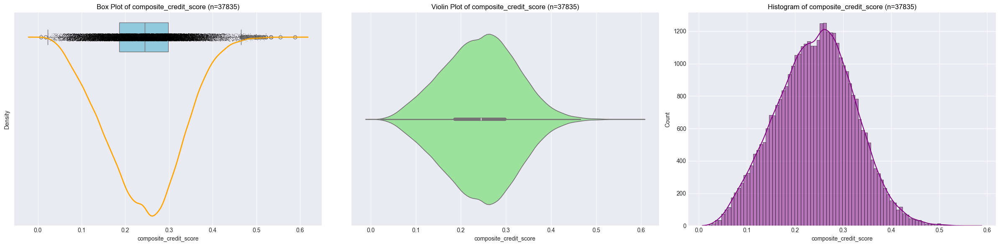

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns


def plot_univariate_analysis(i, column, data):
    print(f'----- {column} -----')
    plt.figure(figsize=(24, 6))

    # Ensure the data is in the correct format (Series or DataFrame)
    column_data = data[column]

    n = column_data.count()

    plt.subplot(1, 3, 1)
    sns.boxplot(x=column_data, color="skyblue")
    sns.stripplot(x=column_data, color='black', size=0.5, jitter=True)
    sns.kdeplot(x=column_data, color='orange', linewidth=2)
    plt.title(f'Box Plot of {column} (n={n})', color='black')

    plt.subplot(1, 3, 2)
    sns.violinplot(x=column_data, color="lightgreen")
    plt.title(f'Violin Plot of {column} (n={n})', color='black')

    plt.subplot(1, 3, 3)
    sns.histplot(column_data, kde=True, color='purple')
    plt.title(f'Histogram of {column} (n={n})', color='black')

    plt.tight_layout()
    plt.show()


for j, v in enumerate(ncols, start=1):
    plot_univariate_analysis(str(j), v, loan_data)

##### Summary for Univariate analysis of Numerical variables

The `loan_amnt` variable shows that most loan amounts are between \\$5,000 and \\$15,000, with a median around \\$10,000. There are high peaks at \\$5,000 and \\$10,000, making these common loan amounts. The histogram and violin plot confirm these values are frequently requested, while up to \\$35,000 are less common. Overall, loans are typically in the \\$5,000 to \\$15,000 range, with a notable preference for \\$10,000.


The `funded_amnt` variable shows a similar pattern to the `loan_amnt`, with most funded amounts between \\$5,000 and \\$15,000 and a median around $10,000. High density around \\$10,000 indicates it is a common value. The KDE plot displays peak densities at \\$5,000 and \\$10,000, and the Histogram confirms these are frequently funded amounts. Outliers up to \\$35,000 are present but less common. Overall, funded amounts typically range from \\$5,000 to \\$15,000, with a notable concentration around \\$10,000, indicating alignment between requested and funded amounts.

The `funded_amnt_inv` variable shows that most investment amounts are between \\$5,000 and \\$15,000, with a median around \\$10,000. Peaks are observed at \\$5,000 and \\$10,000, indicating these are common investment amounts. The histogram and violin plot confirm these frequently funded values, with higher amounts being less common. Overall, the investment amounts typically range from \\$5,000 to \\$15,000, aligning closely with requested and funded amounts.

The `int_rate` variable shows that most loans have interest rates between 7.5% and 15%, with a median around 12.5%. High peaks are observed around 10% to 15%, indicating these are common rates. The histogram and violin plot confirm these frequent values, with higher interest rates being less common. Overall, the majority of loans have interest rates ranging from 7.5% to 15%, with a significant concentration around 10% to 15%.

The `installment` variable shows that most monthly payments are between \\$150 and \\$400, with a median around \\$300. There are high peaks around these values, indicating they are common payment amounts. The histogram and violin plot confirm these frequent values, with higher installments being less common. Overall, typical loan installments range from \\$150 to \\$400, with a significant concentration around \\$300.

The `annual_inc` variable indicates that most borrowers have annual incomes clustered below \\$100,000, with a median around \\$65,000. There is a high density of incomes at the lower end, tapering off towards higher incomes. The histogram and violin plot confirm that while most borrowers report relatively modest incomes, a smaller number have significantly higher incomes. Overall, the distribution shows a concentration of lower annual incomes with fewer high-income borrowers.

The `dti` variable shows that most borrowers have a debt-to-income ratio between 10 and 20, with a median around 15. The distribution has a high density around this range, indicating these are common ratios. The histogram and violin plot confirm these frequent values, with a gradual decrease towards higher ratios. Overall, typical DTIs for borrowers range from 10 to 20, with a significant concentration around 15.

The `delinq_2yrs` variable shows that most borrowers have very few delinquencies, typically between 0 and 1, with a median of 0. The distribution is highly concentrated at 0, indicating the majority of borrowers have no delinquencies. The histogram and violin plot confirm that most borrowers have had no delinquencies in the past two years. Overall, the vast majority of borrowers have a clean or nearly clean delinquency record over the past two years.

The `open_acc` variable shows that most borrowers have between 5 and 15 open credit lines, with a median around 10. The distribution is dense within this range, indicating these are common numbers of open accounts. The histogram and violin plot confirm that having 5 to 15 open accounts is typical. Overall, borrowers usually have between 5 and 15 open credit lines, reflecting common borrowing behavior.

The `revol_bal` variable shows that most revolving balances are between \\$0 and \\$20,000, with a high density of values below \\$10,000. The distribution tapers off towards higher balances. The histogram and violin plot confirm that revolving balances are generally low, with fewer borrowers having balances above \\$20,000. Overall, most borrowers have revolving balances below \\$20,000, indicating conservative use of revolving credit.

The `revol_util` variable shows that most borrowers have revolving line utilization rates between 30% and 80%, with a median around 50%. The distribution is fairly uniform with slight peaks around these values. The histogram and violin plot confirm a broad distribution with significant counts across the entire range from 0% to 100%. Overall, borrowers commonly use about 30% to 80% of their available revolving credit, reflecting diverse credit utilization behaviors.

The `total_acc` variable shows that most borrowers have between 10 and 30 total credit accounts, with a median around 20. The distribution is dense within this range, indicating these are common numbers of total accounts. The histogram and violin plot confirm that having 10 to 30 accounts is typical. Overall, borrowers typically have a total of 10 to 30 credit accounts, reflecting a range of credit histories.

The `pub_rec_bankruptcies` variable shows that the majority of borrowers have no bankruptcies on record, indicated by the high density at 0. The histogram and violin plot confirm that most borrowers have 0 bankruptcies, with very few having 1 or 2 bankruptcies. Overall, nearly all borrowers have no history of bankruptcies, with only a small minority having up to 2 bankruptcies.

The `issue_d_month` variable shows a relatively uniform distribution across all months, with slightly higher counts towards the end of the year. The histogram and violin plot confirm this balanced spread, with a slight increase in loan issuances in the last few months. Overall, loans are issued consistently throughout the year, with a slight increase towards the end of the year.

The `issue_d_year` variable shows a noticeable increase in loan issuances over time, with a significant spike in 2011. The histogram and violin plot confirm a concentration of loan issuances around 2010 and 2011. Overall, there is a clear upward trend in loan issuances, peaking in 2011.

The `credit_history_age_years` variable shows that most borrowers have a credit history age between 0 and 30 years, with a median around 14 years. The distribution is dense within this range, indicating these are common credit history ages. The histogram and violin plot confirm that most values cluster between 10 and 20 years, with fewer borrowers having longer credit histories. Overall, borrowers typically have credit history ages ranging from 0 to 30 years, reflecting a diverse range of credit experience.

The `installment_to_income_ratio` variable shows that most borrowers have a ratio between 0 and 10, with a median around 5. The distribution is dense within this range, indicating these are common ratios. The histogram and violin plot confirm that values tend to cluster around 5, with fewer borrowers having higher ratios. Overall, borrowers typically have an installment to income ratio between 0 and 10, indicating manageable installment payments relative to their income.

The `investor_funding_ratio` variable shows that the vast majority of loans have a funding ratio close to 100%. The distribution is highly concentrated around this value, indicating that most loans are fully funded by investors. The histogram and violin plot confirm the sharp peak at 100%. Overall, nearly all loans are fully funded by investors, indicating high investor confidence and engagement.

The `grade_encoded` variable shows that most loans fall within grades A, B, and C, peaking at A and B. The distribution is dense within these grades, indicating these are common loan grades. The histogram and violin plot confirm this concentration in higher-quality loans. Overall, most loans are assigned grades A, B, and C, reflecting higher-quality loans.

The `sub_grade_encoded` variable shows that most sub-grades are concentrated between A1 and C5, with high density around these values. The histogram and violin plot confirm this distribution. Overall, the finer classification within grades shows most loans fall within sub-grades A1 to C5, indicating higher-quality loans.

The `emp_length_encoded` variable shows a relatively uniform distribution across most employment lengths, with a significant peak at 10+ years. The distribution is consistent across different lengths, indicating varied employment histories among borrowers. The histogram and violin plot highlight the notable increase at the highest value. 

Overall, while borrowers have varied employment lengths, a significant portion has 10+ years of employment, indicating stable employment among many borrowers.

The `loan_status_encoded` variable shows that the majority of loans are fully paid (encoded as 5), with a smaller portion currently active (encoded as -5), and a very small number charged off (encoded as 2). The histogram and violin plot highlight the high density of fully paid loans. Overall, most loans are fully paid, reflecting good repayment behavior among borrowers.

The `loan_risk_level` variable shows that the majority of loans are for less risky purposes like debt consolidation and credit cards (encoded as 1). The distribution has high density at the lower risk levels, with fewer loans at higher risk levels. The histogram and violin plot confirm a significant count for lower-risk loans. Overall, many loans are for purposes like debt consolidation and credit cards, with fewer loans for higher-risk purposes.

`verification_status` box plot highlights minimal spread within categories, the violin plot indicates multimodal distribution and density variations, and the histogram confirms the prevalence of the first and third categories. These visualizations suggest clear separation and distinct central tendencies between the categories

###  Categorical data

In [40]:
# Detail descriptive
display(detailed_descriptive_categorical(loan_data[categorical_cols]))

,missing_values,unique_values,most_frequent,frequency,top_5_frequent
term,0,2,36 months,27498,"{'36 months': 27498, '60 months': 10337}"
grade,0,7,B,11463,"{'B': 11463, 'A': 9547, 'C': 7709, 'D': 5055, ..."
sub_grade,0,35,B3,2797,"{'B3': 2797, 'A4': 2773, 'A5': 2622, 'B5': 260..."
emp_length,0,11,10+ years,8750,"{'10+ years': 8750, '< 1 year': 4397, '2 years..."
home_ownership,0,4,RENT,18030,"{'RENT': 18030, 'MORTGAGE': 16938, 'OWN': 2771..."
verification_status,0,3,Not Verified,15741,"{'Not Verified': 15741, 'Verified': 12327, 'So..."
loan_status,0,3,Fully Paid,31534,"{'Fully Paid': 31534, 'Charged Off': 5203, 'Cu..."
purpose,0,14,debt_consolidation,17913,"{'debt_consolidation': 17913, 'credit_card': 4..."
addr_state,0,49,CA,6803,"{'CA': 6803, 'NY': 3613, 'FL': 2720, 'TX': 261..."
bankruptcy_category,0,2,Not reported,36272,"{'Not reported': 36272, 'Reported': 1563}"


##### Cross tabs

In [41]:
import pandas as pd


def categorical_summary(d):
    summary = {}
    total_records = len(d)

    for column in d.select_dtypes(include=['category', 'object', 'int', 'float']):
        value_counts = d[column].value_counts(dropna=False).reset_index()
        value_counts.columns = [column, 'count']
        value_counts['percentage_total'] = (
            value_counts['count'] / total_records) * 100
        value_counts['percentage_total'] = value_counts['percentage_total'].round(
            0)
        non_nan_count = d[column].dropna().count()
        value_counts['percentage_excl_nan'] = (
            value_counts['count'] / non_nan_count) * 100 if non_nan_count != 0 else 0
        value_counts['percentage_excl_nan'] = value_counts['percentage_excl_nan'].round(
            0)
        summary[column] = value_counts

        print(f'\n\n ----- Summary for {column} -----\n')
        print(value_counts.to_string(index=False))

    # return summary


# We do not want to do this for all columns
c = [
    'term', 'emp_length', 'home_ownership',
    'verification_status', 'loan_status', 'purpose', 'addr_state',
    'bankruptcy_category', 'income_band', 'interest_rate_level'
]

categorical_summary(loan_data[c])



 ----- Summary for term -----

     term  count  percentage_total  percentage_excl_nan
36 months  27498              73.0                 73.0
60 months  10337              27.0                 27.0


 ----- Summary for emp_length -----

emp_length  count  percentage_total  percentage_excl_nan
 10+ years   8750              23.0                 23.0
  < 1 year   4397              12.0                 12.0
   2 years   4293              11.0                 11.0
   3 years   4023              11.0                 11.0
   4 years   3377               9.0                  9.0
   5 years   3235               9.0                  9.0
    1 year   3133               8.0                  8.0
   6 years   2193               6.0                  6.0
   7 years   1747               5.0                  5.0
   8 years   1449               4.0                  4.0
   9 years   1238               3.0                  3.0


 ----- Summary for home_ownership -----

home_ownership  count  percentage

##### Some plots - though not needed here 

----- term -----


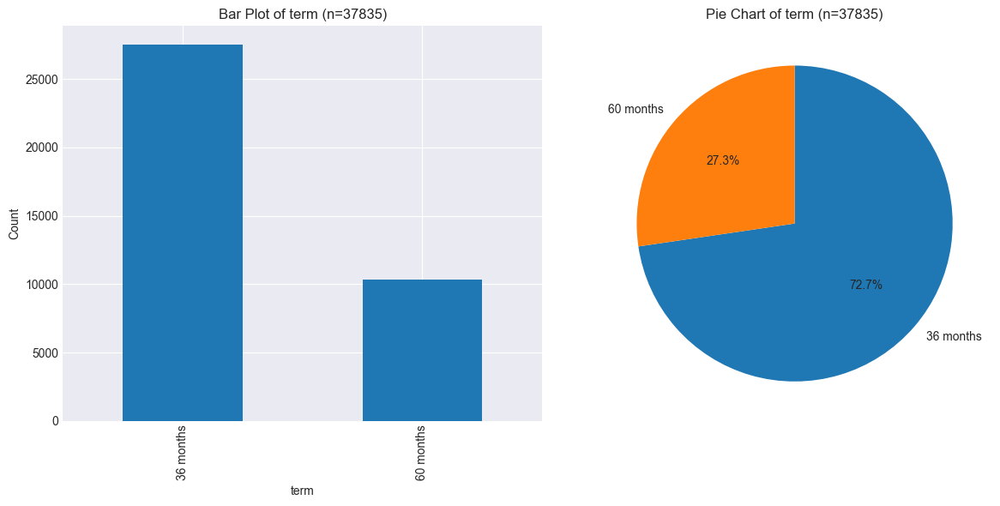

----- emp_length -----


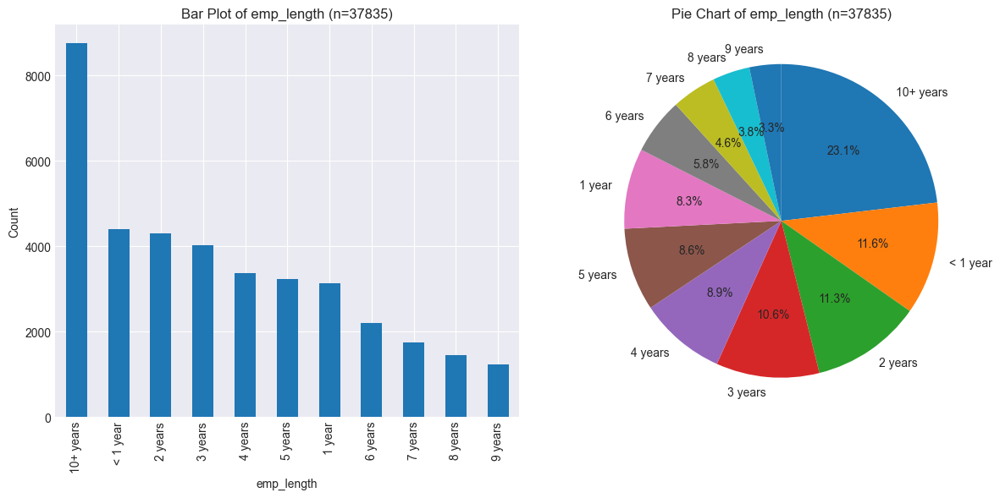

----- home_ownership -----


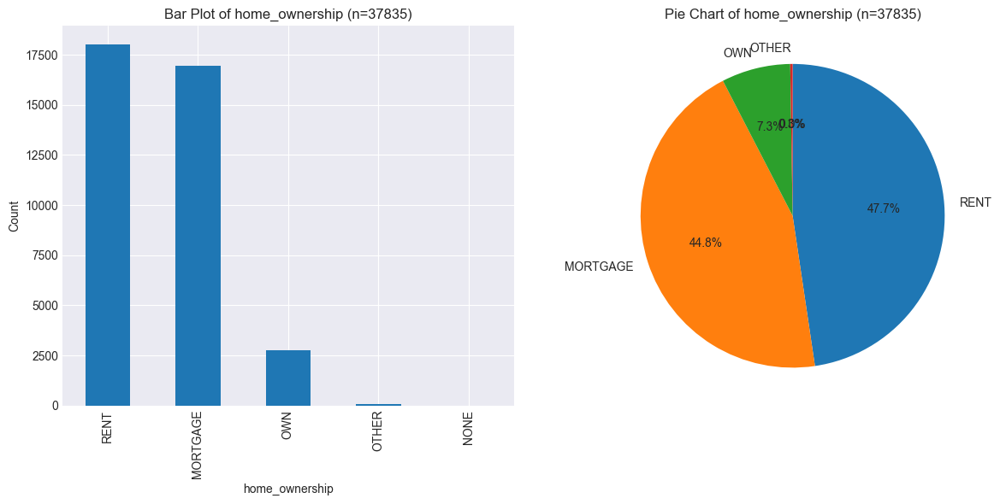

----- verification_status -----


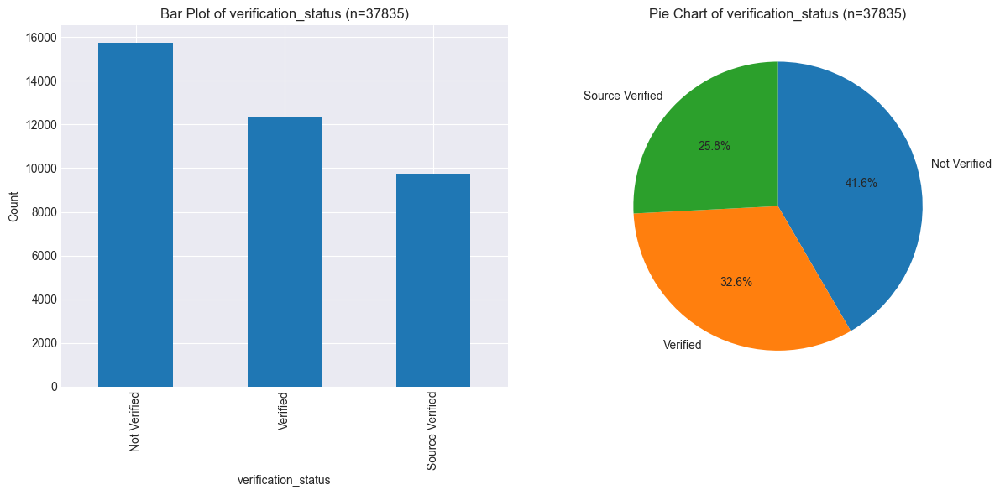

----- loan_status -----


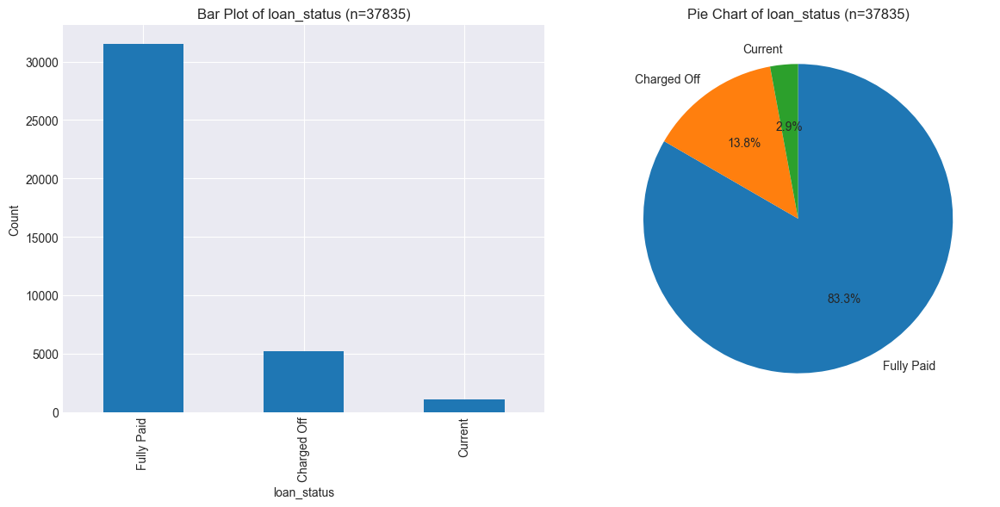

----- purpose -----


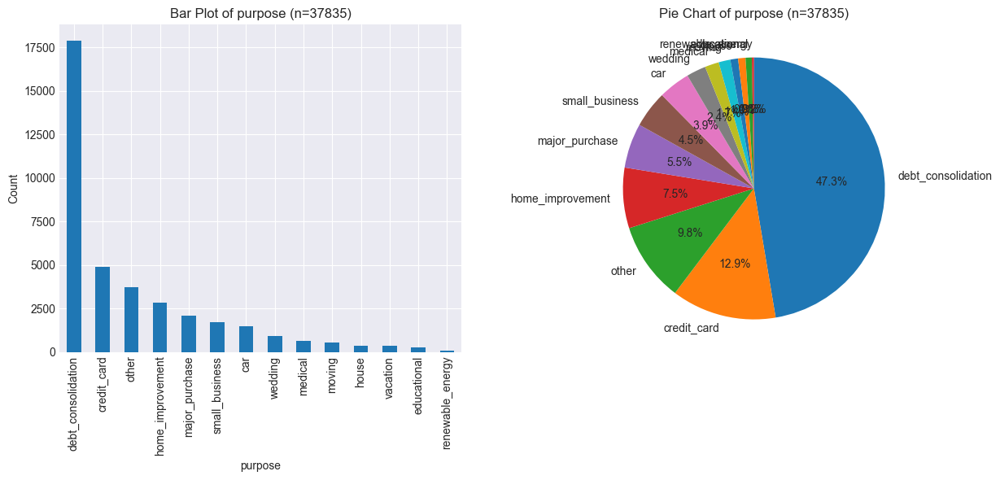

----- addr_state -----


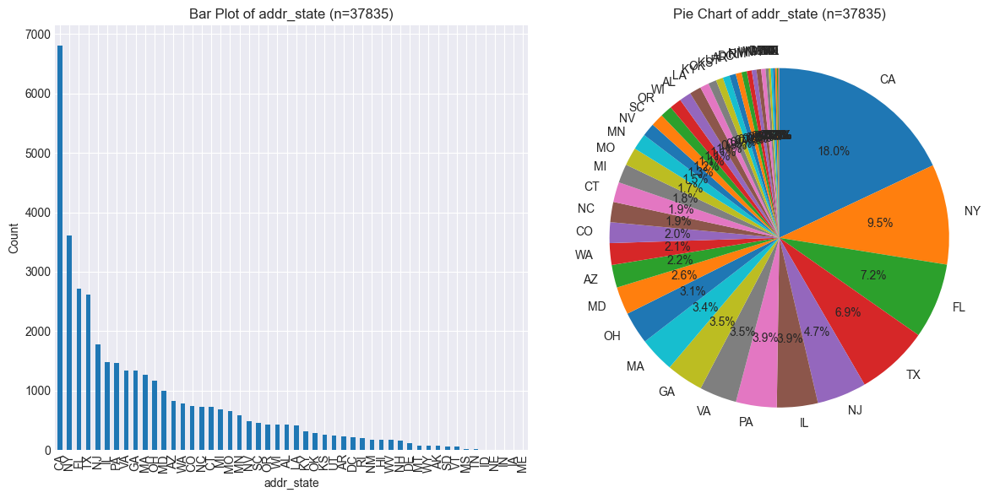

----- bankruptcy_category -----


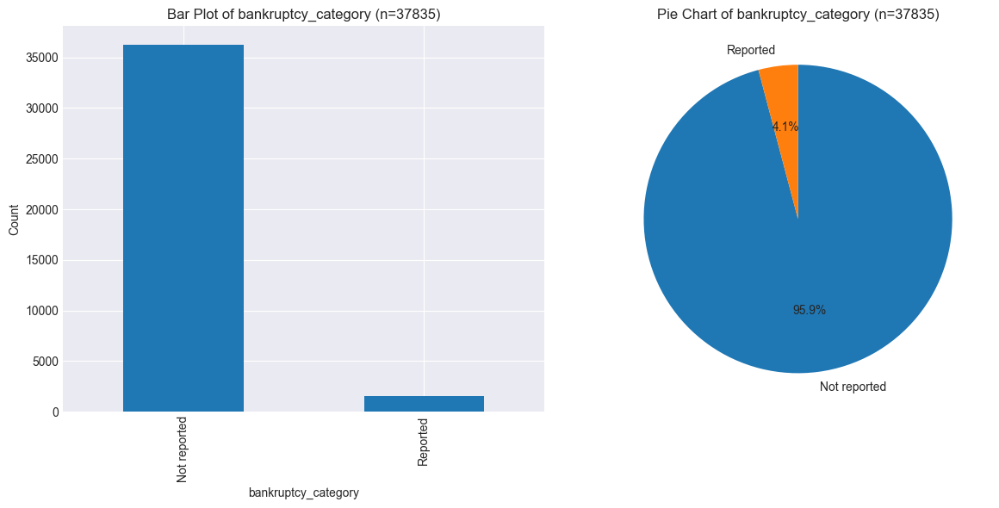

----- income_band -----


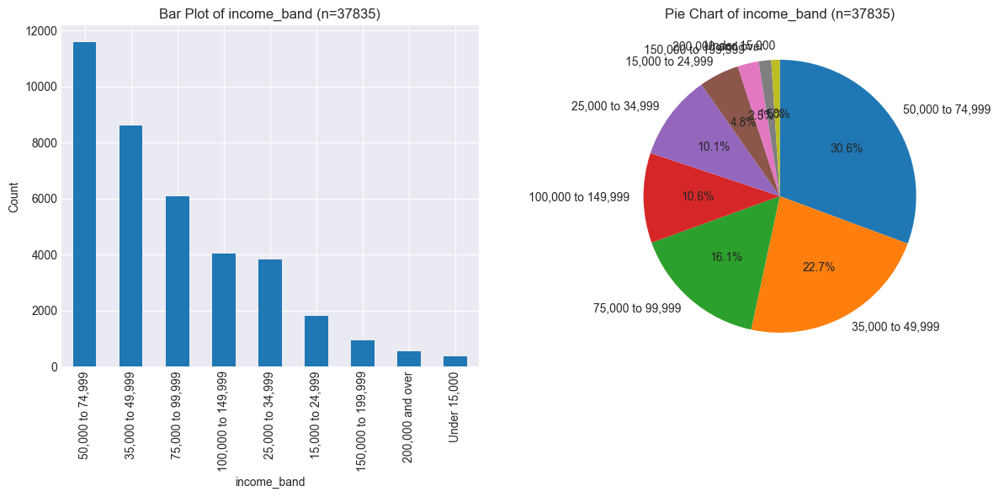

----- interest_rate_level -----


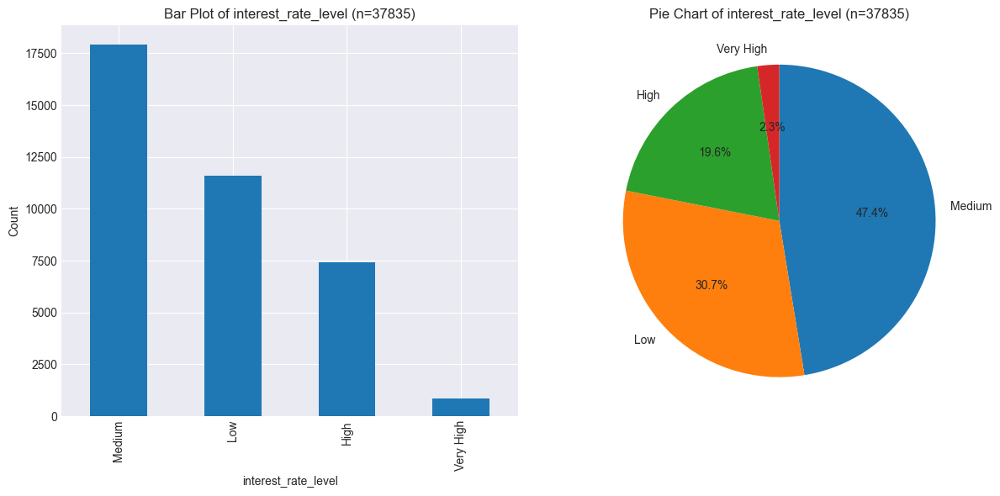

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns


def plot_categorical_univariate(data, column):
    print(f'----- {column} -----')
    plt.figure(figsize=(18, 6))

    n = data[column].count()
    # Bar Plot
    plt.subplot(1, 3, 1)
    data[column].value_counts().plot(kind='bar')
    plt.title(f'Bar Plot of {column} (n={n})')
    plt.xlabel(column)
    plt.ylabel('Count')

    # Pie Chart
    plt.subplot(1, 3, 2)
    data[column].value_counts().plot(kind='pie', autopct='%1.1f%%',
                                     startangle=90, counterclock=False)
    plt.title(f'Pie Chart of {column} (n={n})')
    plt.ylabel('')

    plt.tight_layout()
    plt.show()


c = [
    'term', 'emp_length', 'home_ownership',
    'verification_status', 'loan_status', 'purpose', 'addr_state',
    'bankruptcy_category', 'income_band', 'interest_rate_level'
]

for v in c:
    plot_categorical_univariate(loan_data, v)

##### Summary for Univariate analysis of Categorical variables

`term` - Most loans have a term of 36 months (73%), with the remaining 27% having a term of 60 months.

`home_ownership` - Most borrowers either rent (48%) or have a mortgage (44%), with a smaller portion owning their home (8%).

`verification_status` - Verification status is distributed with 43% not verified, 32% verified, and 25% source verified.

`purpose` - Debt consolidation is the most common purpose (47%), followed by credit card (13%) and other (10%). Same data is also summarized as `loan_risk_level` earlier

`addr_state` - Most loans (18%) are from single state `CA` i.e. `State of California`          

Rest of the `variables` are summarized in detail earlier.

# Bivariate analysis 

###  Correlation matrix

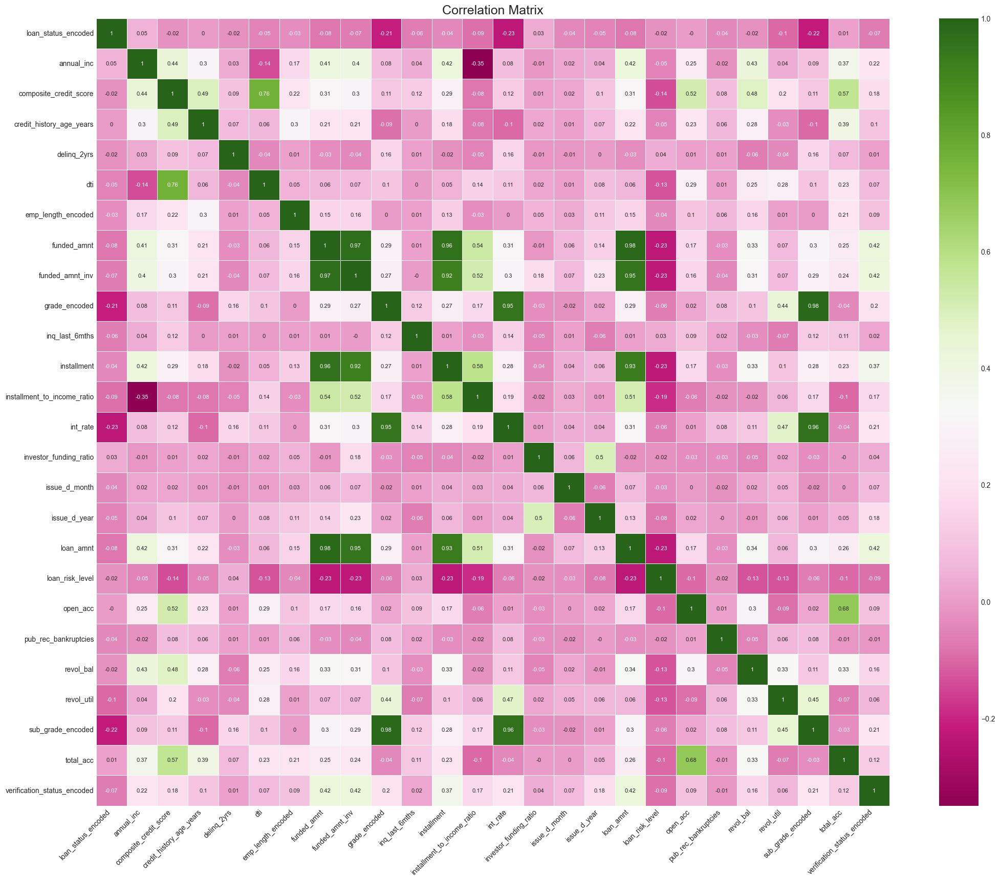

In [43]:
sorted_columns = ['loan_status_encoded'] + sorted(
    [
        col for col in loan_data[ncols].columns if (col != 'loan_status_encoded' and not col.startswith('state'))
    ]
)

# Calculate the correlation matrix
correlation_matrix = loan_data[sorted_columns].corr().round(2)
# correlation_matrix.to_excel('correlation_matrix.xlsx')

# Plot the heatmap with an increased figure size
plt.figure(figsize=(25, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='PiYG',
            linewidths=0.5, annot_kws={"size": 8})
plt.title('Correlation Matrix', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.savefig('correlation_matrix1.png', bbox_inches='tight')
plt.show()

### Following is **NOT MY CODE** but does show clustering nicely

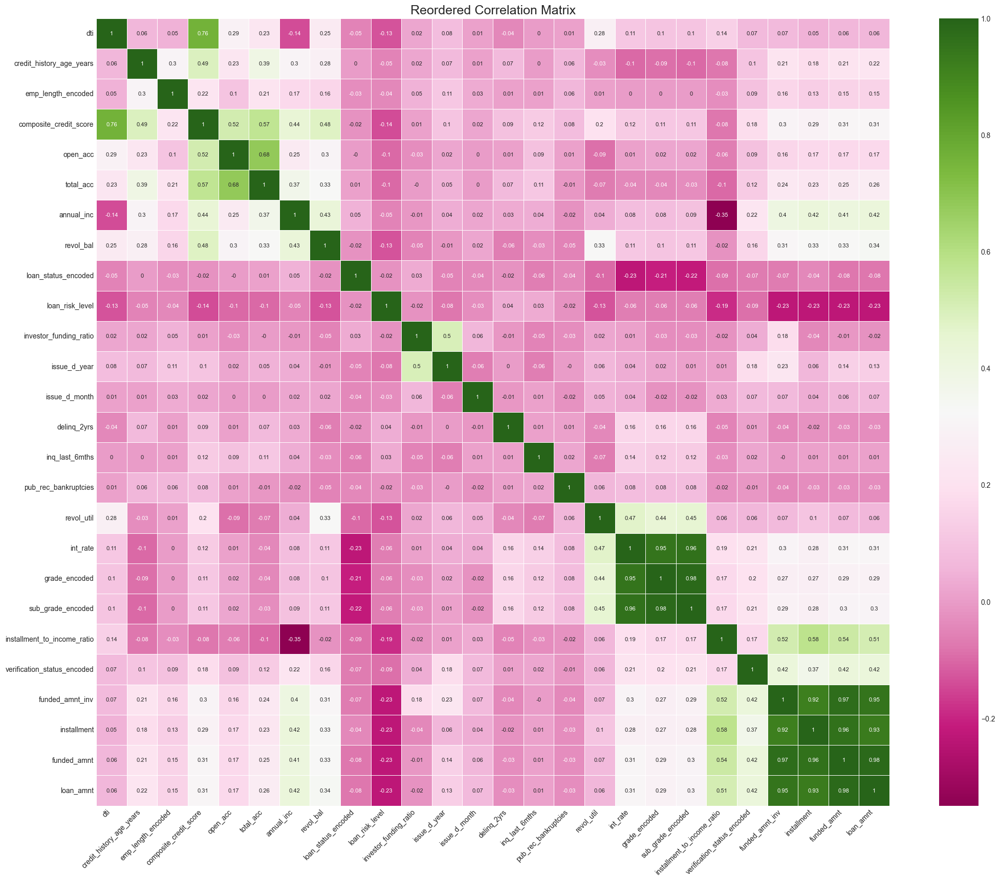

In [44]:
from scipy.cluster.hierarchy import linkage, dendrogram

# Define the sorted columns list excluding 'loan_status_encoded' and 'state'
sorted_columns = ['loan_status_encoded'] + sorted(
    [
        col for col in loan_data[ncols].columns if (col != 'loan_status_encoded' and not col.startswith('state'))
    ]
)

# Calculate the correlation matrix
correlation_matrix = loan_data[sorted_columns].corr().round(2)

# Use hierarchical clustering to reorder the columns based on correlations
linkage_matrix = linkage(correlation_matrix, method='average')
dendro = dendrogram(
    linkage_matrix, labels=correlation_matrix.columns, no_plot=True)
reordered_columns = dendro['ivl']

# Reorder the correlation matrix
reordered_correlation_matrix = correlation_matrix.loc[reordered_columns,
                                                      reordered_columns]

# Save the reordered correlation matrix to an Excel file
# reordered_correlation_matrix.to_excel('reordered_correlation_matrix.xlsx')

# Plot the heatmap with an increased figure size
plt.figure(figsize=(25, 20))
sns.heatmap(reordered_correlation_matrix, annot=True,
            cmap='PiYG', linewidths=0.5, annot_kws={"size": 8})
plt.title('Reordered Correlation Matrix', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.savefig('reordered_correlation_matrix.png', bbox_inches='tight')
plt.show()

### Summary of the Correlation Matrices

1. **Installment and Loan Amounts**: There is a high positive correlation between `installment` and `loan_amnt` (0.93), `funded_amnt` (0.95), and `funded_amnt_inv` (0.97), indicating that higher loan amounts correspond to higher monthly installments. These are obvious correlations and as expected

2. `grade_encoded` and `sub_grade_encoded` are highly correlated (0.98), confirming that sub-grades are detailed classifications within the main grades.

3. There is a moderate negative correlation between `annual_inc` and `installment_to_income_ratio` (-0.39), suggesting that higher incomes tend to lower the installment-to-income ratio.

4. `int_rate` shows a moderate positive correlation with `installment` (0.47) and `grade_encoded` (0.58), implying that higher interest rates are associated with higher installments and lower loan grades (higher risk).

5. `revol_util` has a moderate positive correlation with `int_rate` (0.47) and a moderate negative correlation with `annual_inc` (-0.31), indicating that higher utilization rates are linked to higher interest rates and lower incomes.

6. `dti` has a moderate negative correlation with `annual_inc` (-0.14), suggesting that higher incomes are associated with lower debt-to-income ratios.

7. `open_acc` and `total_acc` are moderately correlated (0.58), indicating that borrowers with more open accounts tend to have more total accounts.

8. `loan_status_encoded` shows a moderate positive correlation with `grade_encoded` (0.21) and a negative correlation with `loan_risk_level` (-0.22), indicating that higher loan statuses (fully paid) are linked to better grades and lower risk levels.

9. `composite_credit_score` shows correlations to columns used for its calculation which is expected but it does not show any significant inside into loan_status. 


These key correlations highlight the relationships between loan amounts, interest rates, borrower income, and credit usage, which are crucial for understanding borrower behavior and loan performance.

### Cross tabs v/s loan_status

In [45]:
categorical_cols

['term',
 'grade',
 'sub_grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'loan_status',
 'purpose',
 'addr_state',
 'bankruptcy_category',
 'income_band',
 'interest_rate_level']

In [46]:
def cross_tabulate_categorical(d, catvar):
    cross_tabs = {}
    for var in catvar:
        cross_tab = pd.crosstab(
            d[var], d['loan_status'], margins=True, normalize='index') * 100
        cross_tab = cross_tab.round(2)
        print()
        print()
        print(f' -----{var}-----\n')
        print(cross_tab)

        # cross_tabs[var] = cross_tab
    # return cross_tabs


cross_tabulate_categorical(loan_data, categorical_cols)



 -----term-----

loan_status  Charged Off  Current  Fully Paid
term                                         
36 months          10.53     0.00       89.47
60 months          22.33    10.62       67.05
All                13.75     2.90       83.35


 -----grade-----

loan_status  Charged Off  Current  Fully Paid
grade                                        
A                   5.72     0.37       93.91
B                  11.45     2.85       85.69
C                  15.94     3.33       80.72
D                  20.49     4.27       75.23
E                  24.76     6.38       68.85
F                  30.10     7.03       62.87
G                  31.07     5.50       63.43
All                13.75     2.90       83.35


 -----sub_grade-----

loan_status  Charged Off  Current  Fully Paid
sub_grade                                    
A1                  2.31     0.00       97.69
A2                  4.68     0.00       95.32
A3                  5.06     0.00       94.94
A4               

### Scatter plots and pair plots

We do not really need to see `loan_status` = `Current` at this point and data for it has been excluded.

Here is what we have understood after few iterations.

**`NOTE`* following code may take up 5 minutes to run**

| Variable                      | Correlation | Description                                                                                  |
|-------------------------------|-------------|----------------------------------------------------------------------------------------------|
| Interest Rate (`int_rate`)    | -0.25       | Higher interest rates are associated with a higher likelihood of loans being charged off.     |
| Loan Grade (`grade_encoded`)  | 0.37        | Lower loan grades (higher encoded values) are more likely to be charged off.                  |
| Loan Risk Level (`loan_risk_level`) | 0.32  | Higher loan risk levels are associated with higher chances of loans being charged off.        |
| Debt-to-Income Ratio (`dti`)  | -0.16       | Higher DTI ratios are associated with a higher probability of loans being charged off.        |
| Revolving Utilization (`revol_util`) | -0.14 | Higher revolving utilization rates are associated with a higher likelihood of loans being charged off. |
| Annual Income (`annual_inc`)  | 0.14        | Lower annual incomes are associated with a higher likelihood of loans being charged off.      |
| Loan Amount (`loan_amnt`)     | 0.08        | Higher loan amounts have a slight correlation with being charged off.                         |
| Credit History Age (`credit_history_age_years`) | 0.18 | Older credit histories are associated with better loan outcomes.                             |
| Employment Length (`emp_length_encoded`) | 0.13 | Longer employment lengths are associated with better loan outcomes.                          |
| Installment-to-Income Ratio (`installment_to_income_ratio`) | -0.10 | Higher installment-to-income ratios are associated with a higher probability of loans being charged off. |


<Figure size 3000x3000 with 0 Axes>

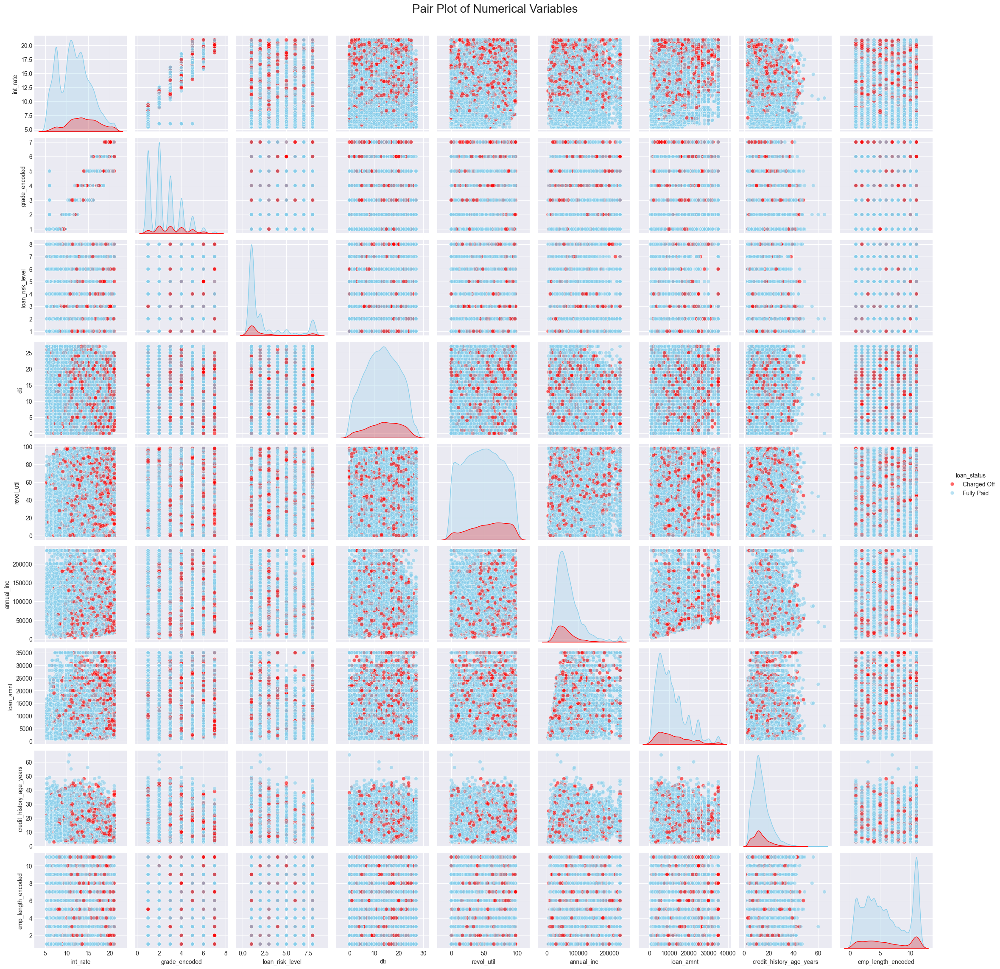

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns


def plot_scatter_and_pair(data, target_col, ncols):
    plt.figure(figsize=(30, 30))

    pair_plot = sns.pairplot(
        data=data[ncols + [target_col]],
        palette=['red', 'skyblue'],
        hue=target_col,
        diag_kind='kde',  # Use Kernel Density Estimate for diagonal plots
        plot_kws={'alpha': 0.6, 's': 40},
        diag_kws={'fill': True}  # Shade the KDE plots
    )
    pair_plot.fig.suptitle(
        'Pair Plot of Numerical Variables', y=1.02, fontsize=20)
    plt.show()

# int_rate
# grade_encoded
# loan_risk_level
# dti
# revol_util
# annual_inc
# loan_amnt
# credit_history_age_years
# emp_length_encoded

target_col = 'loan_status'
c = [
    'int_rate',
    'grade_encoded',
    'loan_risk_level',
    'dti',
    'revol_util',
    'annual_inc',
    'loan_amnt',
    'credit_history_age_years',
    'emp_length_encoded'
]
# 'installment_to_income_ratio',

# We do not really need to see `Current`
d = loan_data[loan_data['loan_status'] != 'Current'].copy(deep=True)
d['loan_status'] = pd.Categorical(d['loan_status'],
                                  categories=['Charged Off', 'Fully Paid'],
                                  ordered=True
                                  )

plot_scatter_and_pair(d, target_col, c)

# def plot_box_plots(data, categorical_cols, target_col):
#     for column in categorical_cols:
#         plt.figure(figsize=(12, 6))
#         sns.boxplot(x=column, y=target_col, data=data)
#         plt.title(f'Box Plot of {target_col} by {column}')
#         plt.xlabel(column)
#         plt.ylabel(target_col)
#         plt.xticks(rotation=45)
#         plt.show()

# plot_box_plots(d, categorical_cols, target_col)

### Conclusion from Scatter/pair plots

The pair plot shows a comprehensive view of the relationships between various numerical features and the target variable `loan_status` (represented by different colors). To determine the biggest impact on `loan_status`, especially for loans that are charged off, we can analyze some key observations from the chart:

1. **Interest Rate (`int_rate`)**:
    - There is a clear distinction in `int_rate` distributions between `Fully Paid` and `Charged Off` loans. Loans with higher interest rates are more likely to be charged off, indicating that a higher interest rate might be a significant risk factor.

2. **Grade (`grade_encoded`)**:
    - The loan grade shows a notable pattern where lower grades (which are higher risk) are more associated with `Charged Off` loans. This reinforces the idea that loan grades are a strong indicator of risk.

3. **Calculated loan risk (`loan_risk_level`)**:
    - This derived metric is not working as expected.

4. **Debt-to-Income Ratio (`dti`)**:
    - There is some separation visible in `dti` between `Fully Paid` and `Charged Off` loans, though it is not as pronounced as `int_rate`. Higher `dti` values slightly tend to be associated with charged-off loans, suggesting that higher debt-to-income ratios could be a contributing factor to loan defaults.

5. **Revolving credit utilization `revol_util`** 
    - Records with `Charged Off` loan show higher credit utilization compare to `Fully Paid`. Relationship is not conclusive on its own. 

6. **Annual Income (`annual_inc`)**:
    - There is a slight trend where lower annual incomes are more associated with `Charged Off` loans. This suggests that borrowers with lower incomes might have a higher risk of defaulting.

7. **Loan Amount (`loan_amnt`)**:
    - The `loan_amnt` does not show a very strong separation between `Fully Paid` and `Charged Off` loans. However, it might still play a role in conjunction with other factors.

8. **Credit History Age (`credit_history_age_years`)**:
    - The age of credit history shows some separation where younger credit histories (fewer years) might be more associated with `Charged Off` loans. This suggests that less established credit histories could contribute to higher risk.

9. **Employment Length (`emp_length_encoded`)**:
    - There seems to be a pattern where shorter employment lengths are slightly more associated with `Charged Off` loans, suggesting that job stability might impact loan repayment ability.

Overall, the features that seem to have the biggest impact on the likelihood of a loan being charged off are:

1. **Interest Rate (`int_rate`)**: Higher rates are strongly associated with charged-off loans.
2. **Grade (`grade_encoded`)**: Lower grades (as per `grade_encoded`) correlate with higher risk.
3. **Debt-to-Income Ratio (`dti`)**: Higher ratios are slightly more associated with defaults.
4. **Annual Income (`annual_inc`)**: Lower incomes show a higher risk of default.
5. **Credit History Age (`credit_history_age_years`)**: Shorter credit histories are more prone to defaults.

These observations suggest that loan defaults are more likely for borrowers with `higher interest rates`, `lower loan grades`, `higher debt-to-income ratios`, `lower annual incomes`, and `shorter employment and credit histories`.

# Univariate Segmented 

### Charged off v/s Fully Paid

We will focus on following variables and compare it against two segment in `loan_status` i.e. `Charged Off` and `Fully Paid` 

- `loan_amnt`
- `int_rate`
- `installment`
- `dti`
- `annual_inc`
- `credit_history_age_years`
- `emp_length_encoded`
- `installment_to_income_ratio`
- `grade_encoded`
- `revol_util`
- `purpose`
- `inq_last_6mths`

In [48]:
loan_data[loan_data['loan_status'] == 'Fully Paid']['loan_amnt'].value_counts()

loan_amnt
10000    2332
12000    1888
5000     1639
6000     1600
15000    1525
         ... 
21575       1
4225        1
15425       1
13675       1
23575       1
Name: count, Length: 816, dtype: int64

In [49]:
loan_data[loan_data['loan_status'] == 'Charged Off']['loan_amnt'].value_counts()

loan_amnt
10000    334
12000    289
5000     267
15000    242
25000    233
        ... 
2875       1
1275       1
20375      1
20200      1
2150       1
Name: count, Length: 463, dtype: int64

----- loan_amnt -----


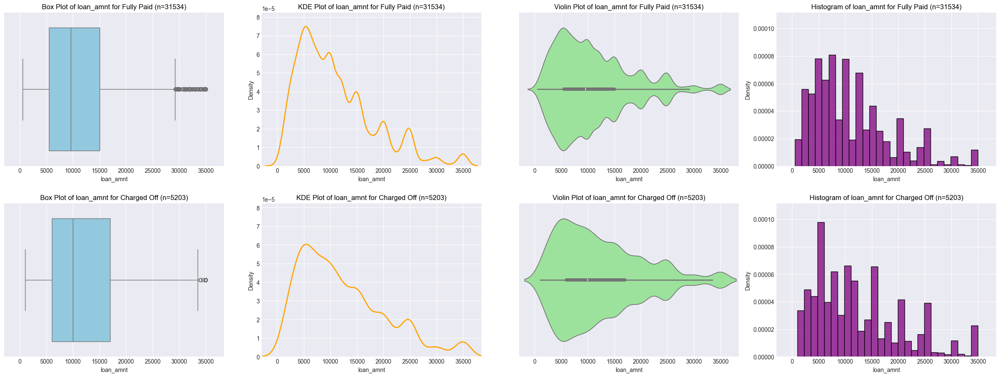

----- int_rate -----


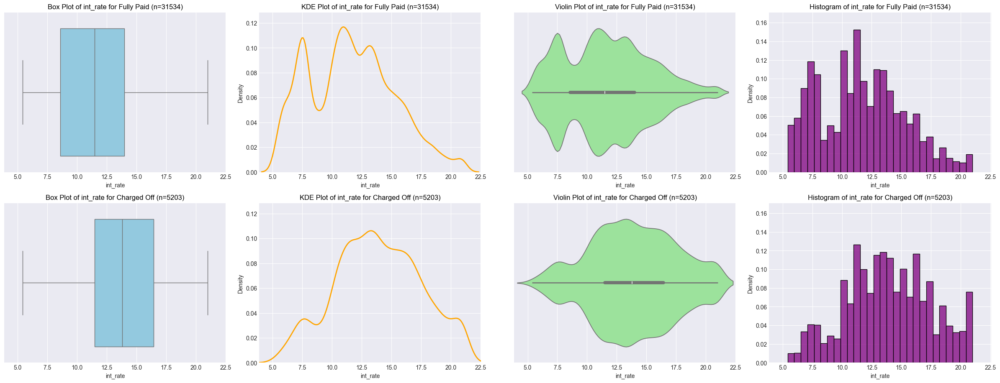

----- installment -----


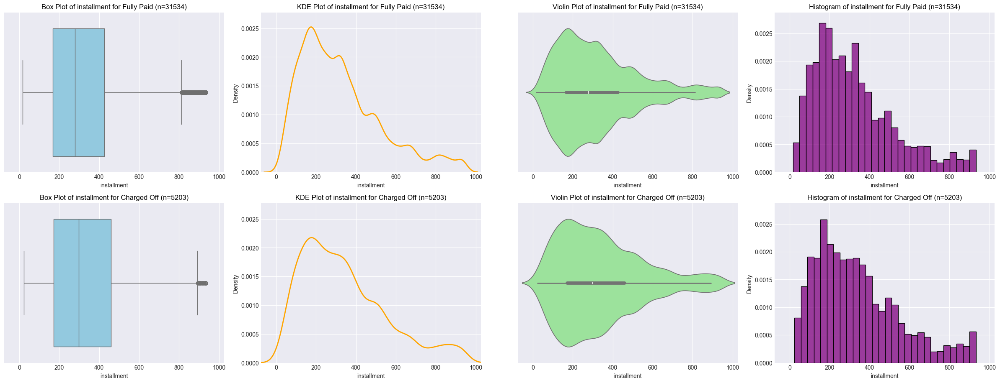

----- dti -----


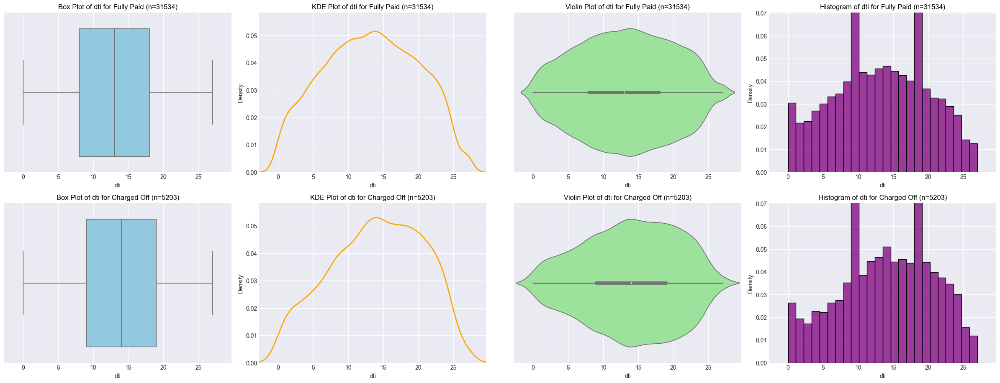

----- annual_inc -----


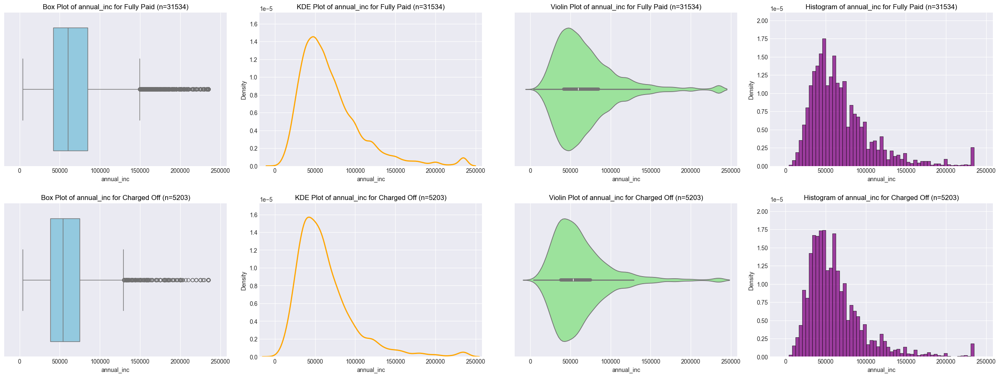

----- credit_history_age_years -----


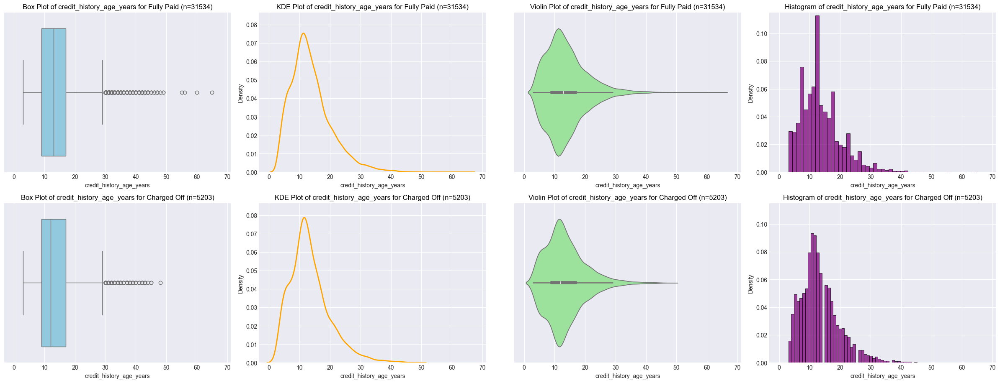

----- emp_length_encoded -----


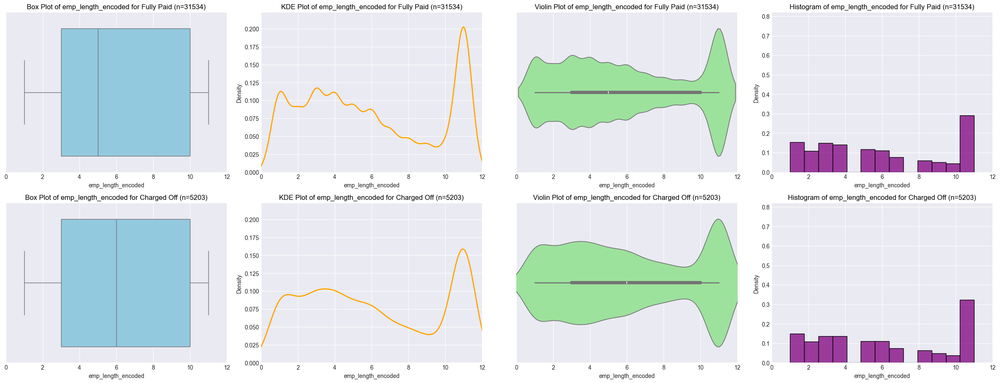

----- installment_to_income_ratio -----


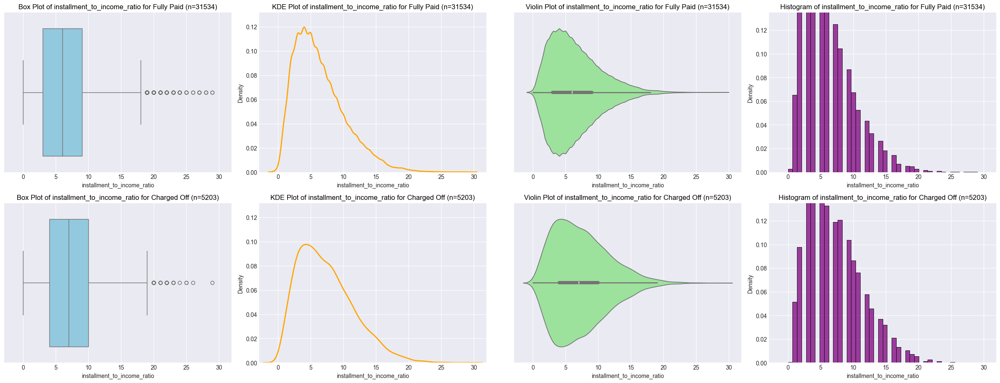

----- grade_encoded -----


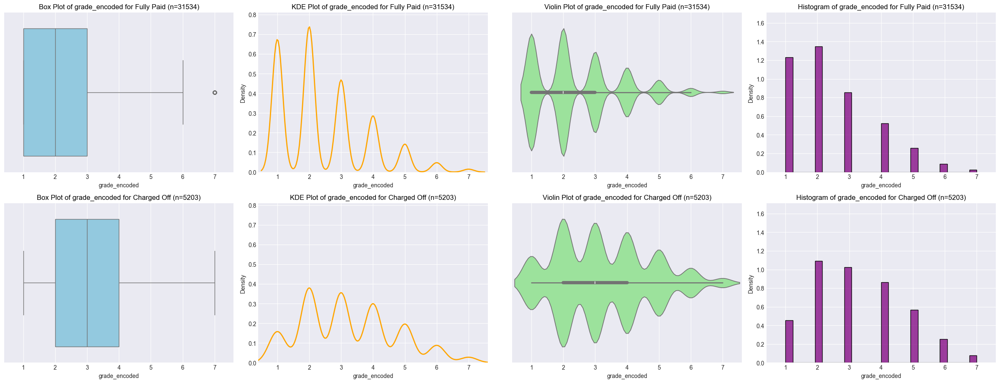

----- sub_grade_encoded -----


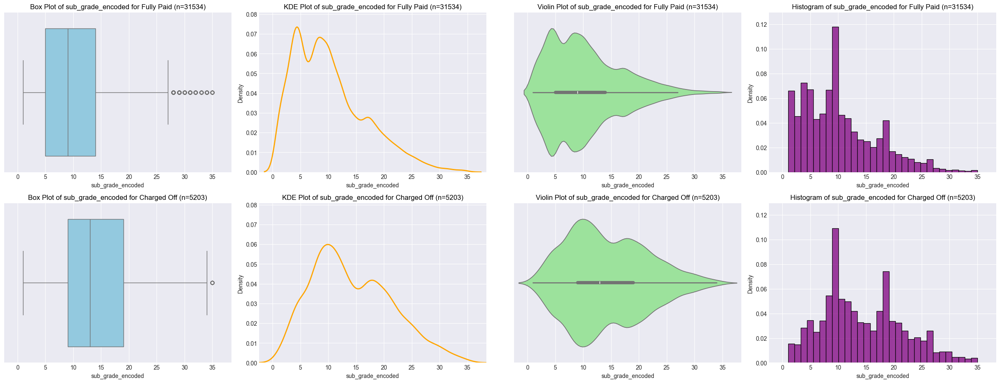

----- revol_util -----


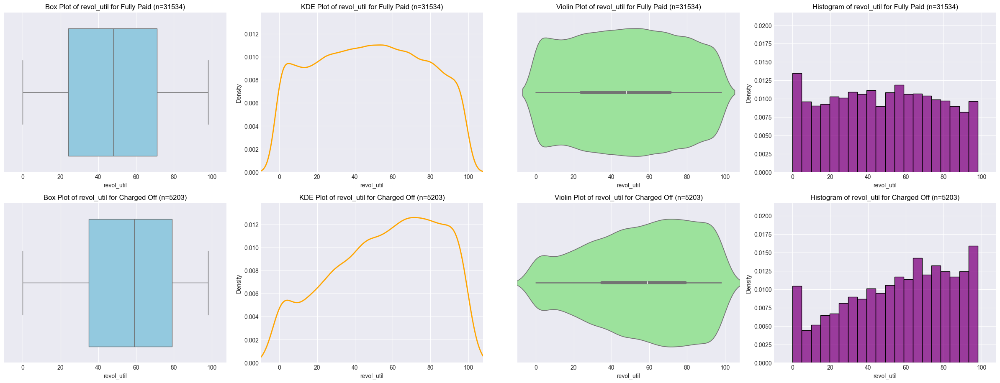

----- inq_last_6mths -----


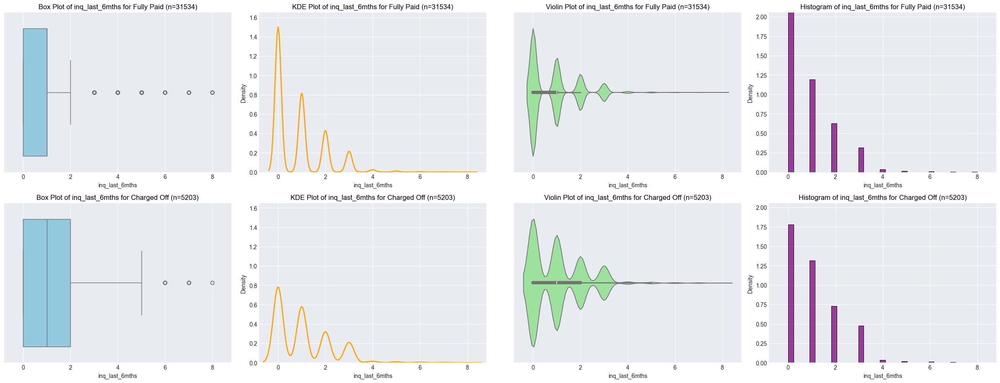

In [50]:
# Several attempts have been made to ensure axis align for respetive plot but it does not work in few cases. 
# In real world we would have used custom scale for each variable but that is too much work for student work

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_segmented_analysis(column, data):
    print(f'----- {column} -----')

    def bin_width(data):
        q75, q25 = np.percentile(data, [75, 25])
        iqr = q75 - q25
        bin_width = 2 * iqr / np.cbrt(len(data))
        return bin_width

    segments = ['Fully Paid', 'Charged Off']
    segment_column = 'loan_status'

    # Initialize variables to store maximum y-limits and x-limits
    max_y_kde = 0
    max_y_hist = 0
    max_bins = 10000
    min_x = float('inf')
    max_x = float('-inf')

    # Calculate the maximum y-limits and x-limits
    for segment in segments:
        segment_data = data[data[segment_column] == segment]
        column_data = segment_data[column]

        # Calculate dynamic bin width and number of bins
        bn = bin_width(column_data)
        max_bins = min(
            int(np.ceil((column_data.max() - column_data.min()) / bn)), max_bins)

        # KDE plot
        kde = sns.kdeplot(x=column_data, color='orange').get_lines()[
            0].get_ydata().max()
        max_y_kde = max(max_y_kde, kde)
        plt.close()

        # Histogram
        hist, _ = np.histogram(column_data, bins=30, density=True)
        max_y_hist = max(max_y_hist, hist.max())

        # Update x-axis limits
        min_x = min(min_x, column_data.min())
        max_x = max(max_x, column_data.max())

    # Add padding to x-axis limits
    x_padding = (max_x - min_x) * 0.1
    min_x -= x_padding
    max_x += x_padding

    # Add padding to y-axis limits
    y_padding_kde = max_y_kde * 0.1
    y_padding_hist = max_y_hist * 0.1

    plt.figure(figsize=(24, 18))

    for i, segment in enumerate(segments):
        segment_data = data[data[segment_column] == segment]
        column_data = segment_data[column]
        count = len(column_data)

        plt.subplot(4, 4, i*4 + 1)
        sns.boxplot(x=column_data, color="skyblue")
        plt.xlim(min_x, max_x)
        plt.title(
            f'Box Plot of {column} for {segment} (n={count})', color='black')

        plt.subplot(4, 4, i*4 + 2)
        sns.kdeplot(x=column_data, color='orange', linewidth=2)
        plt.xlim(min_x, max_x)
        plt.title(
            f'KDE Plot of {column} for {segment} (n={count})', color='black')
        plt.ylim(0, max_y_kde + y_padding_kde)

        plt.subplot(4, 4, i*4 + 3)
        sns.violinplot(x=column_data, color="lightgreen")
        plt.xlim(min_x, max_x)
        plt.title(
            f'Violin Plot of {column} for {segment} (n={count})', color='black')

        plt.subplot(4, 4, i*4 + 4)
        sns.histplot(column_data, stat='density',
                     color='purple', bins=max_bins)
        plt.xlim(min_x, max_x)
        plt.title(
            f'Histogram of {column} for {segment} (n={count})', color='black')
        plt.ylim(0, max_y_hist + y_padding_hist)

    plt.tight_layout()
    # plt.savefig(f'{column}.png')
    plt.show()


nvars = ['loan_amnt', 'int_rate', 'installment', 'dti', 'annual_inc', 'credit_history_age_years', 'emp_length_encoded',
         'installment_to_income_ratio', 'grade_encoded', 'sub_grade_encoded', 'revol_util', 'inq_last_6mths']

for i, v in enumerate(nvars, start=1):
    plot_segmented_analysis(v, loan_data)


### Conclusion from Segmented Univariate

The analysis of `loan_amnt` for both fully paid and charged-off loans reveals that the majority of loans are between \$5,000 and \$15,000, with a median around \$10,000. Both groups exhibit similar loan amount distributions, though charged-off loans have a broader spread, indicating more variability. Despite this, the loan amount alone does not strongly differentiate between fully paid and charged-off loans, highlighting the need to consider additional factors for a comprehensive risk assessment.

The analysis of `int_rate` for fully paid and charged-off loans shows that fully paid loans generally have interest rates clustered around 9-14%, while charged-off loans have higher rates, typically around 11-16%. This indicates that higher interest rates are associated with an increased likelihood of loan default. It is possible that lenders offer higher interest rates to riskier loans and riskier customers, reflecting the lender's assessment of higher risk. This aligns with the observation that charged-off loans have a broader and higher distribution of interest rates, emphasizing the role of `int_rate` in assessing loan risk.

`Installment` does not show any significant variation across loan statuses 

The analysis of `dti` (debt-to-income ratio) for both fully paid and charged-off loans shows similar distributions, with most values ranging from 10 to 20. Fully paid loans exhibit a slightly higher density around the mid-range (10-15), while charged-off loans have a broader spread and a slight peak around 15-20. This suggests that higher `dti` values are somewhat associated with an increased risk of default, but the overlap between fully paid and charged-off loans indicates that `dti` alone is not a strong predictor of loan status.

The analysis of annual income `annual_inc` shows loan with default have slighly lower income range. Though this does indicate higher income range ensure loans are fully paid.

The analysis of `credit_history_age_years` for fully paid and charged-off loans indicates that fully paid loans generally have longer credit histories, with most values clustered around 10-15 years. Charged-off loans show a similar but slightly broader distribution, with a higher density of shorter credit histories (around 5-10 years). This suggests that shorter credit histories are associated with a higher risk of default, indicating that the length of credit history is an important factor in loan performance. However, there is still significant overlap between the two groups.

The analysis of `emp_length_encoded` (employment length) for fully paid and charged-off loans indicates that both groups have similar distributions, with a notable peak at the maximum employment length (10+ years). Fully paid loans have slightly more density at the higher employment lengths, while charged-off loans show a broader spread across all employment lengths. This suggests that longer employment length is associated with a lower risk of default, but the significant overlap indicates that employment length alone does not strongly predict loan status.

The analysis of `installment_to_income_ratio` for fully paid and charged-off loans shows similar distributions, with most values ranging from 0 to 10. Fully paid loans tend to have a slightly higher density at lower ratios (0-5), indicating more manageable installment-to-income ratios. Charged-off loans display a broader spread with a noticeable peak around 5-10, suggesting that higher installment-to-income ratios are associated with an increased risk of default. However, the overlap between the two groups indicates that this ratio alone is not a definitive predictor of loan status.

The plots for both `grade` and `sub-grade` encoded variables provide insights into factors driving loan defaults. For the grade variable, fully paid loans generally have lower grades, with a median of "B," and show the highest density at grades "A" and "B." In contrast, charged-off loans have a higher median grade of "C" and peaks at grades "B" and "C," indicating higher grades correlate with increased default risk. The sub-grade variable shows a similar pattern: fully paid loans cluster around lower sub-grades, with peaks at "A2" and "B2," while charged-off loans show higher median sub-grades around "C3," peaking at "B2" and "D1." These patterns suggest that higher grades and sub-grades, which reflect lower creditworthiness and higher interest rates, are associated with a higher likelihood of loan defaults. The wider spread in sub-grades for charged-off loans further indicates variability in default risk among higher sub-grades. This analysis highlights that lower grades and sub-grades, indicative of higher creditworthiness, are significant factors in reducing the risk of loan defaults.

The analysis of `revol_util` (revolving line utilization rate) for fully paid and charged-off loans shows similar distributions, with most values ranging from 20% to 80%. Fully paid loans exhibit a relatively even distribution, while charged-off loans show a slightly higher density at higher utilization rates (60-80%). This suggests that higher revolving utilization rates are associated with an increased risk of default, but the substantial overlap between the two groups indicates that `revol_util` alone is not a strong predictor of loan status.

`inq_last_6mths` or `number of inquiries in the last 6 months` shows that both fully paid and charged-off loans have most borrowers with 0 to 2 inquiries.

# Correlation by loan status segment

We will focus on following variables and correaltion by two segment in `loan_status` i.e. `Charged Off` and `Fully Paid` 

`loan_amnt`
`int_rate`
`installment`
`dti`
`annual_inc`
`credit_history_age_years`
`emp_length_encoded`
`installment_to_income_ratio`
`grade_encoded`
`sub_grade_encoded`
`revol_util`
`purpose`

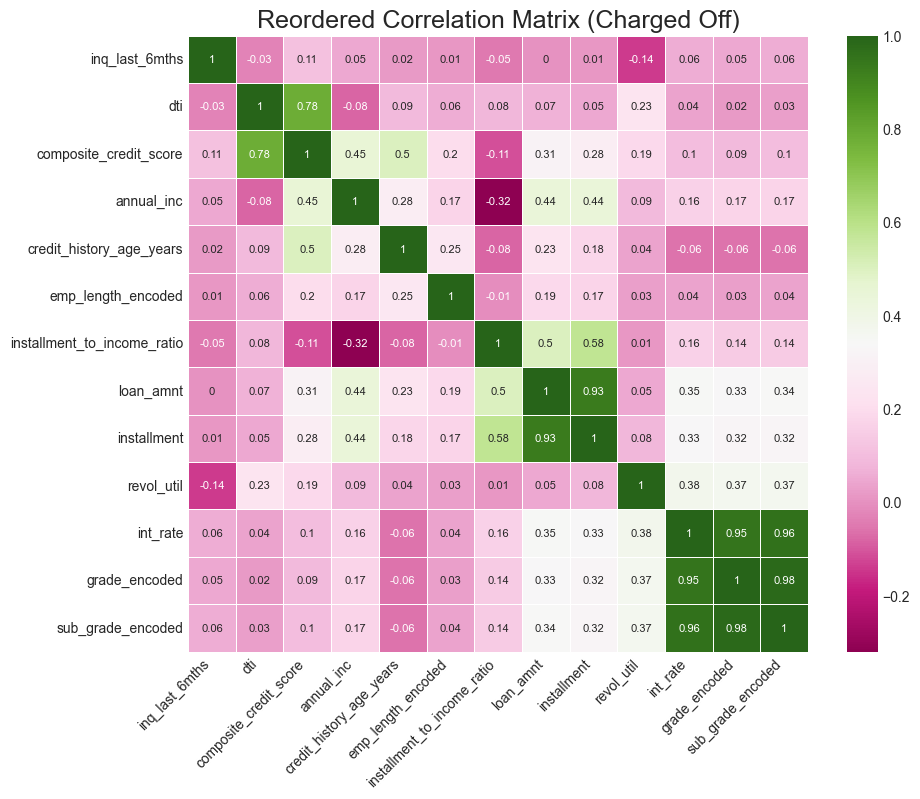

In [51]:
from scipy.cluster.hierarchy import linkage, dendrogram

nvars = ['loan_amnt', 'int_rate', 'installment', 'dti', 'annual_inc',
         'credit_history_age_years', 'emp_length_encoded', 'installment_to_income_ratio',
         'grade_encoded', 'sub_grade_encoded',
         'revol_util', 'inq_last_6mths', 'composite_credit_score']

# Calculate the correlation matrix
correlation_matrix = loan_data[loan_data['loan_status']
                               == 'Charged Off'][nvars].corr().round(2)

# Use hierarchical clustering to reorder the columns based on correlations
linkage_matrix = linkage(correlation_matrix, method='average')
dendro = dendrogram(
    linkage_matrix, labels=correlation_matrix.columns, no_plot=True)
reordered_columns = dendro['ivl']

# Reorder the correlation matrix
reordered_correlation_matrix = correlation_matrix.loc[reordered_columns,
                                                      reordered_columns]

# Save the reordered correlation matrix to an Excel file
# reordered_correlation_matrix.to_excel('reordered_correlation_matrix.xlsx')

# Plot the heatmap with an increased figure size
plt.figure(figsize=(10, 8))
sns.heatmap(reordered_correlation_matrix, annot=True,
            cmap='PiYG', linewidths=0.5, annot_kws={"size": 8})
plt.title('Reordered Correlation Matrix (Charged Off)', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.savefig('reordered_correlation_matrix.png', bbox_inches='tight')
plt.show()

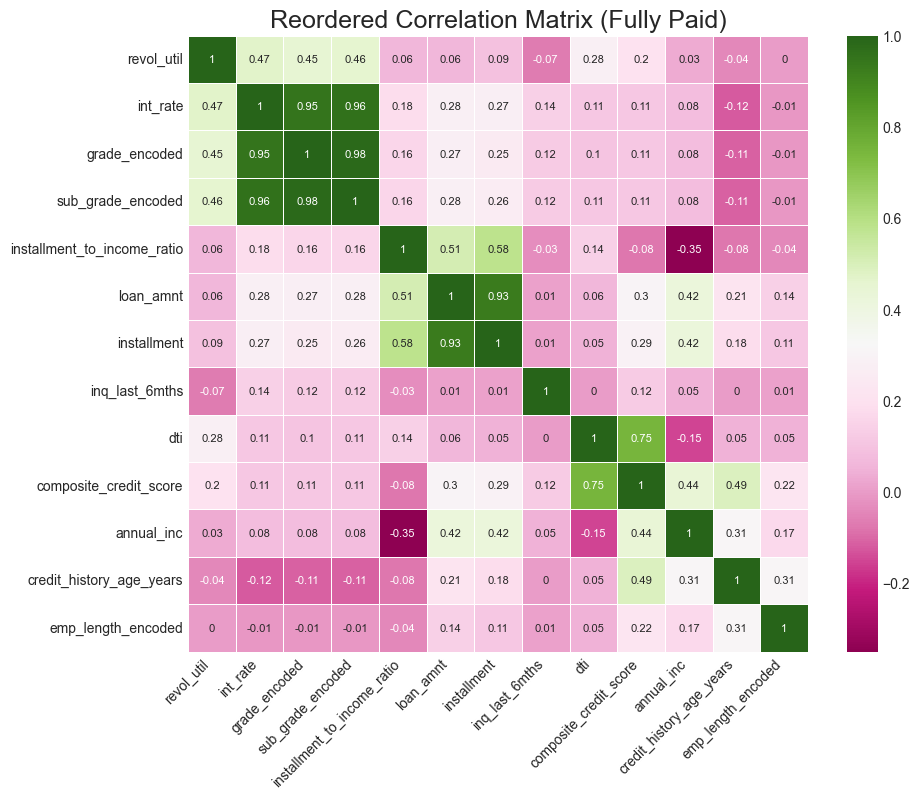

In [52]:
from scipy.cluster.hierarchy import linkage, dendrogram

nvars = ['loan_amnt', 'int_rate', 'installment', 'dti', 'annual_inc',
         'credit_history_age_years', 'emp_length_encoded', 'installment_to_income_ratio',
         'grade_encoded', 'sub_grade_encoded',
         'revol_util', 'inq_last_6mths', 'composite_credit_score']

# Calculate the correlation matrix
correlation_matrix = loan_data[loan_data['loan_status']
                               == 'Fully Paid'][nvars].corr().round(2)

# Use hierarchical clustering to reorder the columns based on correlations
linkage_matrix = linkage(correlation_matrix, method='average')
dendro = dendrogram(
    linkage_matrix, labels=correlation_matrix.columns, no_plot=True)
reordered_columns = dendro['ivl']

# Reorder the correlation matrix
reordered_correlation_matrix = correlation_matrix.loc[reordered_columns,
                                                      reordered_columns]

# Save the reordered correlation matrix to an Excel file
# reordered_correlation_matrix.to_excel('reordered_correlation_matrix.xlsx')

# Plot the heatmap with an increased figure size
plt.figure(figsize=(10, 8))
sns.heatmap(reordered_correlation_matrix, annot=True,
            cmap='PiYG', linewidths=0.5, annot_kws={"size": 8})
plt.title('Reordered Correlation Matrix (Fully Paid)', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.savefig('reordered_correlation_matrix.png', bbox_inches='tight')
plt.show()

### Conclusion post segmented correlation matrices.  

#### Charged-Off Loans Correlation Matrix
- **Installment and Loan Amount (0.93)**: Higher loan amounts correspond to higher installments.
- **Grade and Interest Rate (0.95)**: Higher grades are associated with higher interest rates, indicating higher risk.
- **Annual Income and Loan Amount (0.42)**: Higher annual incomes are linked with higher loan amounts.
- **Installment to Income Ratio and Loan Amount (0.51)**: Higher loan amounts contribute to higher installment-to-income ratios.
- **Annual Income and Installment to Income Ratio (-0.35)**: Higher incomes lead to lower installment-to-income ratios, reducing default risk.

#### Fully Paid Loans Correlation Matrix
- **Strong Correlations**:
  - **Installment and Loan Amount (0.93)**: Higher loan amounts result in higher installments.
  - **Grade and Interest Rate (0.95)**: Higher grades correlate with higher interest rates, indicating higher risk loans.
- **Moderate Correlations**:
  - **Annual Income and Loan Amount (0.44)**: Higher incomes are associated with higher loan amounts.
  - **Installment to Income Ratio and Loan Amount (0.50)**: Higher loan amounts increase the installment-to-income ratio.
- **Negative Correlation**:
  - **Annual Income and Installment to Income Ratio (-0.32)**: Higher incomes result in lower installment-to-income ratios, indicating better loan performance.

#### Conclusion
Key drivers of charged-off loans include high `debt-to-income ratios`, `higher installment-to-income ratios`, and `higher loan amounts`. For fully paid loans, `higher incomes` and `lower installment-to-income` ratios are important. Both matrices highlight that `higher loan amounts`, `interest rates`, and `grades` are significant factors associated with loan performance.

# Final Insights and Recommendations

#### Insights from Univariate and Segmented Analysis

   - **Annual Income:** Most borrowers have incomes below $100,000, with a right-skewed distribution. Higher incomes are associated with better loan performance.
   - **Debt-to-Income Ratio (DTI):** The DTI ratio shows a wide range, with higher values slightly more associated with defaults.
   - **Interest Rate:** Higher interest rates are linked to higher loan risk and are more prevalent in charged-off loans.
   - **Loan Amounts:** Higher loan amounts correlate with higher monthly installments and are distributed similarly in both fully paid and charged-off loans.
   - **Loan Status:** Most loans are fully paid, with a smaller portion being charged off, indicating good overall repayment behavior of `Lending Club`
   - **Employment Length:** Longer employment lengths are associated with lower default risk, while shorter employment lengths show a broader distribution across loan statuses.
   - **Home Ownership:** Borrowers mostly rent or have a mortgage, with few owning their home outright.
   - **Purpose of Loan:** Debt consolidation and credit card repayment are the most common purposes, indicating prevalent financial behaviors.

#### Insights from Bivariate and Correlation Analysis

1. **Correlation Analysis:**
   - **Loan Amount and Installment:** A high positive correlation exists between loan amount and monthly installment.
   - **Interest Rate and Loan Status:** Higher interest rates are strongly associated with charged-off loans, reinforcing their riskiness.
   - **Grade and Loan Status:** Lower loan grades (indicating higher risk) correlate with higher default rates.
   - **Annual Income and Loan Amount:** Higher incomes are associated with larger loan amounts but lower installment-to-income ratios.
   - **Installment-to-Income Ratio:** Higher ratios are linked to higher default risk but show overlap between fully paid and charged-off loans.

2. **Key Factors Influencing Loan Default:**
   - **Interest Rate:** Higher interest rates are charged for risker loans. Current analsysis does not clarify if this approach pays off.
   - **Loan Grade:** Lower grades correlate with a higher risk of default, necessitating a stricter review process for these loan applicants.
   - **Debt-to-Income Ratio:** Higher DTI ratios are slightly more associated with defaults.
   - **Annual Income:** Lower incomes increase the risk of default.
   - **Credit History Age:** Shorter credit histories are prone to defaults.
   - **Employment Length:** Shorter employment lengths are slightly more associated with defaults.

#### Recommendations:

1. **Interest Rate Adjustments:**
   - Implement stricter criteria for loans with higher interest rates due to their strong association with defaults. Adjust the interest rate model to better reflect default risk.
   - A further deep dive is needed to understand if high interest rate justify risker loans

2. **Loan Grade Improvements:**
   - Loand grade is good indictor of default but is not always accurate. Enhance the loan grading system to more accurately capture default risk. Tighten criteria for lower grades and provide incentives for higher-grade loans.

3. **Debt-to-Income Ratio Monitoring:**
   - Closely monitor borrowers with high DTI ratios. Offer financial counseling or debt management support to these borrowers.

4. **Targeted Marketing and Risk Management:**
   - Focus marketing to borrowers with higher incomes and longer credit histories, as these are associated with lower default risk. Develop targeted risk management strategies for lower-income borrowers with shorter credit histories.

5. **Employment Stability:**
   - Incorporate employment length as a significant factor in the loan approval process. Offer loan products tailored to borrowers with stable, long-term employment.

6. **Enhanced Data Collection and Analysis:**
   - Improve data collection methods to capture more granular information on borrower behavior and financial health. Regularly update the analysis to reflect changing trends and patterns in loan defaults.

#### Future Investigations:

1. **High Interest Rates and High Risk Loans:**
   - Further deep is needed to understand if high rewards from higher interest rates justify the increased risk of defaults.
2. **Deep dive into loan Grade**
   - Current analysis did not explore relationship of `grade` with rest of the parameters. This analysis is needed to make recommendation to better loan application grading